**3D UNet, FedAdam**

**Imports & Drive Mount**

In [39]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [40]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [41]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [42]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [43]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints"
log_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

Checkpoints will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12720), started 7 days, 15:55:14 ago. (Use '!kill 12720' to kill it.)

In [44]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [45]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [46]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [47]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


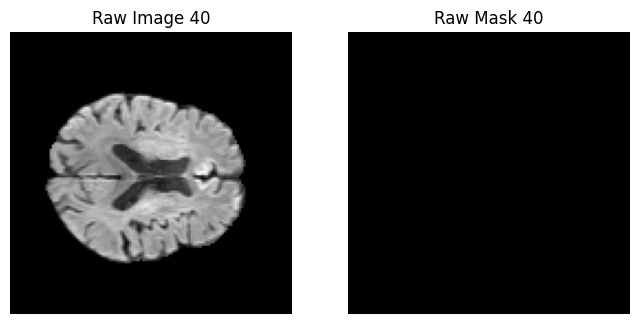

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


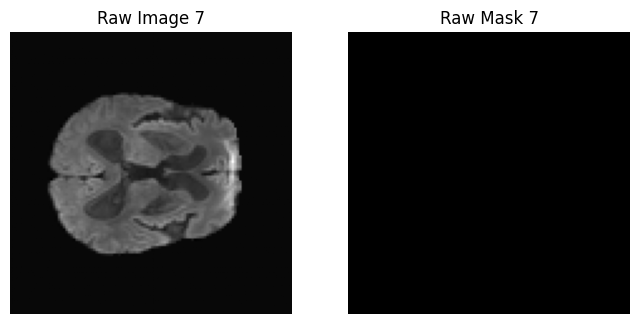

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


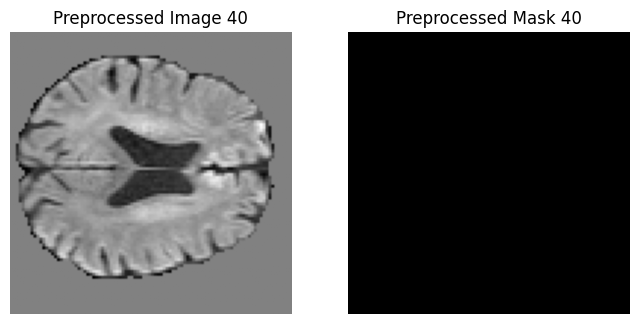

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


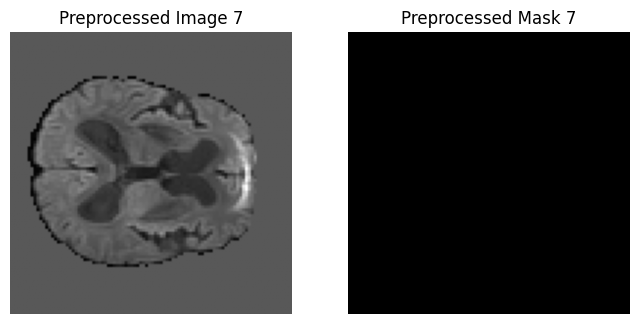

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


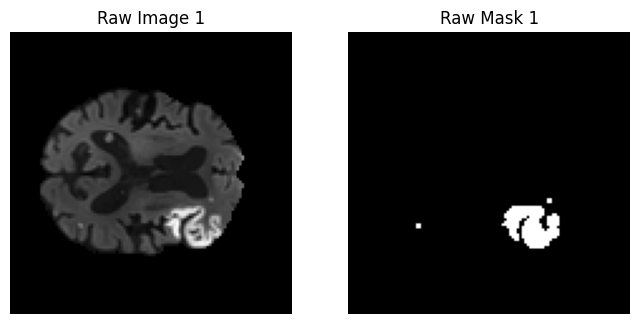

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


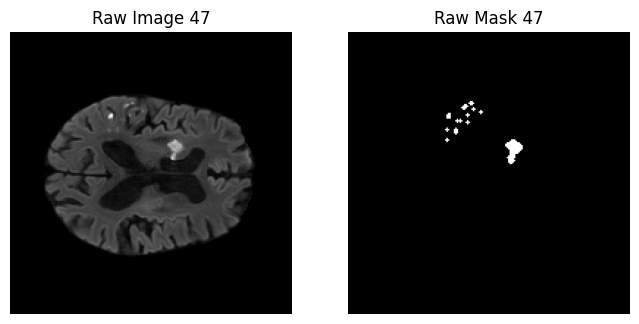

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


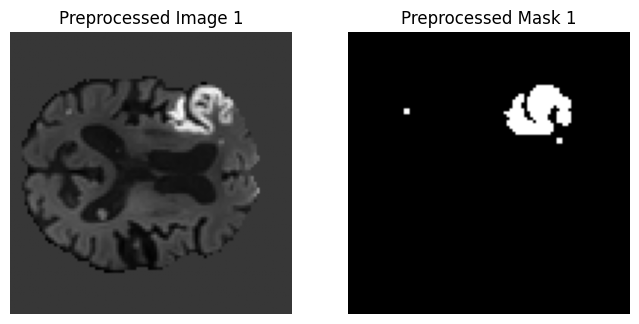

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


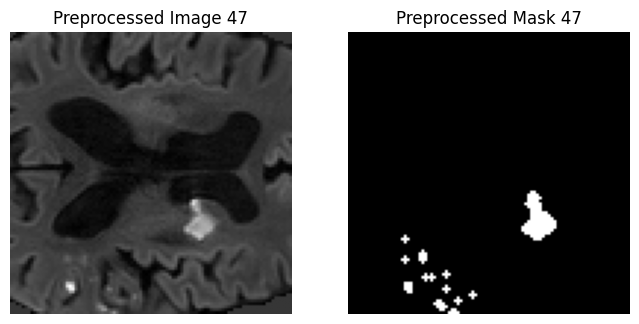

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


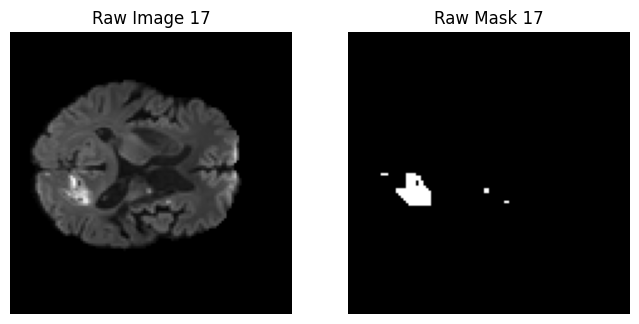

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


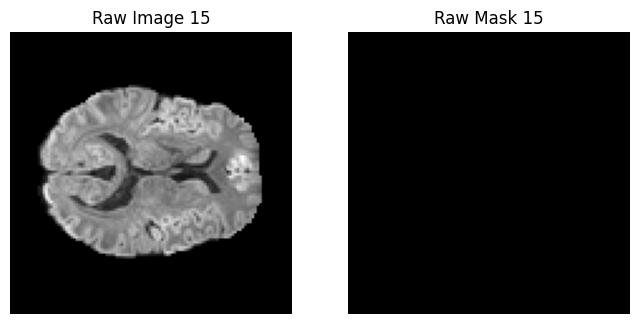

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


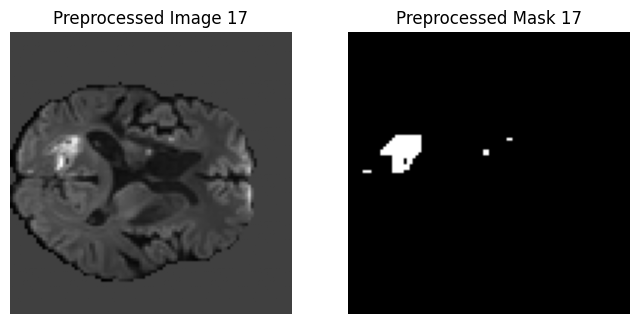

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


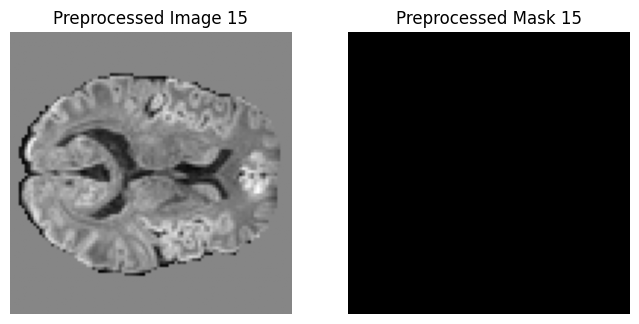

Client 2 samples: 50


In [48]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [49]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


UNet

In [50]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [51]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
    print(model)
    return model

Using device: cuda:0


**Client Class**

In [52]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [53]:
class Server:
    def __init__(self, val_loader, device, lr=1e-3, beta1=0.9, beta2=0.999, eps=1e-8):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        
         # FedAdam
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.eps = eps

        # Adam states
        self.m = {}
        self.v = {}

        for k, v in self.global_model.state_dict().items():
            if v.dtype != torch.long:
                self.m[k] = torch.zeros_like(v)
                self.v[k] = torch.zeros_like(v)
       

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):

        global_params = self.global_model.state_dict()

        # Step 1: compute FedAvg weights
        avg_params = copy.deepcopy(client_params_list[0])

        for key in avg_params.keys():
            for i in range(1, len(client_params_list)):
                avg_params[key] += client_params_list[i][key]
            avg_params[key] /= len(client_params_list)

        # Step 2: compute delta
        new_params = {}

        for key in global_params.keys():

            # skip integer tensors (like num_batches_tracked)
            if global_params[key].dtype == torch.long:
                new_params[key] = global_params[key]
                continue
            
            avg_param = avg_params[key].to(self.device)
            
            delta = avg_param - global_params[key]

            # Adam momentum
            self.m[key] = self.beta1 * self.m[key] + (1 - self.beta1) * delta
            self.v[key] = self.beta2 * self.v[key] + (1 - self.beta2) * (delta ** 2)

            update = self.lr * self.m[key] / (torch.sqrt(self.v[key]) + self.eps)

            new_params[key] = global_params[key] + update

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [54]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [55]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9241 | Dice: 0.0094 | IoU: 0.0047 | HD95: 64.4132


Client 0 | Epoch 2/20 | Loss: 0.9098 | Dice: 0.0230 | IoU: 0.0116 | HD95: 54.1273


Client 0 | Epoch 3/20 | Loss: 0.9052 | Dice: 0.0286 | IoU: 0.0145 | HD95: 51.3721


Client 0 | Epoch 4/20 | Loss: 0.9023 | Dice: 0.0333 | IoU: 0.0169 | HD95: 48.6357


Client 0 | Epoch 5/20 | Loss: 0.8999 | Dice: 0.0370 | IoU: 0.0188 | HD95: 47.4770


Client 0 | Epoch 6/20 | Loss: 0.8979 | Dice: 0.0421 | IoU: 0.0215 | HD95: 45.7316


Client 0 | Epoch 7/20 | Loss: 0.8963 | Dice: 0.0478 | IoU: 0.0245 | HD95: 44.7965


Client 0 | Epoch 8/20 | Loss: 0.8950 | Dice: 0.0534 | IoU: 0.0274 | HD95: 43.9241


Client 0 | Epoch 9/20 | Loss: 0.8938 | Dice: 0.0586 | IoU: 0.0302 | HD95: 43.0857


Client 0 | Epoch 10/20 | Loss: 0.8926 | Dice: 0.0637 | IoU: 0.0329 | HD95: 42.7803


Client 0 | Epoch 11/20 | Loss: 0.8916 | Dice: 0.0687 | IoU: 0.0356 | HD95: 42.4811


Client 0 | Epoch 12/20 | Loss: 0.8907 | Dice: 0.0734 | IoU: 0.0381 | HD95: 42.2011


Client 0 | Epoch 13/20 | Loss: 0.8898 | Dice: 0.0782 | IoU: 0.0407 | HD95: 41.9878


Client 0 | Epoch 14/20 | Loss: 0.8890 | Dice: 0.0820 | IoU: 0.0427 | HD95: 41.6360


Client 0 | Epoch 15/20 | Loss: 0.8881 | Dice: 0.0863 | IoU: 0.0451 | HD95: 41.3945


Client 0 | Epoch 16/20 | Loss: 0.8873 | Dice: 0.0910 | IoU: 0.0477 | HD95: 41.1089


Client 0 | Epoch 17/20 | Loss: 0.8865 | Dice: 0.0957 | IoU: 0.0502 | HD95: 40.7417


Client 0 | Epoch 18/20 | Loss: 0.8858 | Dice: 0.0989 | IoU: 0.0520 | HD95: 40.5445


Client 0 | Epoch 19/20 | Loss: 0.8849 | Dice: 0.1032 | IoU: 0.0544 | HD95: 40.2939


Clients Training:  33%|███▎      | 1/3 [02:23<04:47, 143.85s/it]

Client 0 | Epoch 20/20 | Loss: 0.8842 | Dice: 0.1064 | IoU: 0.0562 | HD95: 40.0660
Client 0 | Loss=0.8947 | Dice=0.1064 | IoU=0.0562 | HD95=40.0660


Client 1 | Epoch 1/20 | Loss: 0.9246 | Dice: 0.0073 | IoU: 0.0037 | HD95: 61.3974


Client 1 | Epoch 2/20 | Loss: 0.9097 | Dice: 0.0193 | IoU: 0.0097 | HD95: 52.4592


Client 1 | Epoch 3/20 | Loss: 0.9048 | Dice: 0.0252 | IoU: 0.0128 | HD95: 48.5502


Client 1 | Epoch 4/20 | Loss: 0.9018 | Dice: 0.0306 | IoU: 0.0156 | HD95: 45.4046


Client 1 | Epoch 5/20 | Loss: 0.8995 | Dice: 0.0346 | IoU: 0.0176 | HD95: 43.6950


Client 1 | Epoch 6/20 | Loss: 0.8977 | Dice: 0.0394 | IoU: 0.0201 | HD95: 42.1519


Client 1 | Epoch 7/20 | Loss: 0.8963 | Dice: 0.0447 | IoU: 0.0229 | HD95: 40.8472


Client 1 | Epoch 8/20 | Loss: 0.8949 | Dice: 0.0509 | IoU: 0.0261 | HD95: 39.7858


Client 1 | Epoch 9/20 | Loss: 0.8938 | Dice: 0.0555 | IoU: 0.0285 | HD95: 39.2826


Client 1 | Epoch 10/20 | Loss: 0.8927 | Dice: 0.0613 | IoU: 0.0316 | HD95: 38.8690


Client 1 | Epoch 11/20 | Loss: 0.8918 | Dice: 0.0660 | IoU: 0.0341 | HD95: 38.6691


Client 1 | Epoch 12/20 | Loss: 0.8908 | Dice: 0.0719 | IoU: 0.0373 | HD95: 38.4201


Client 1 | Epoch 13/20 | Loss: 0.8899 | Dice: 0.0777 | IoU: 0.0404 | HD95: 38.1929


Client 1 | Epoch 14/20 | Loss: 0.8891 | Dice: 0.0826 | IoU: 0.0431 | HD95: 37.9383


Client 1 | Epoch 15/20 | Loss: 0.8883 | Dice: 0.0864 | IoU: 0.0452 | HD95: 37.8470


Client 1 | Epoch 16/20 | Loss: 0.8874 | Dice: 0.0931 | IoU: 0.0488 | HD95: 37.4602


Client 1 | Epoch 17/20 | Loss: 0.8866 | Dice: 0.0984 | IoU: 0.0517 | HD95: 37.2263


Client 1 | Epoch 18/20 | Loss: 0.8858 | Dice: 0.1044 | IoU: 0.0551 | HD95: 37.1069


Client 1 | Epoch 19/20 | Loss: 0.8850 | Dice: 0.1086 | IoU: 0.0574 | HD95: 36.7753


Clients Training:  67%|██████▋   | 2/3 [04:53<02:27, 147.29s/it]

Client 1 | Epoch 20/20 | Loss: 0.8843 | Dice: 0.1144 | IoU: 0.0607 | HD95: 36.6177
Client 1 | Loss=0.8947 | Dice=0.1144 | IoU=0.0607 | HD95=36.6177


Client 2 | Epoch 1/20 | Loss: 0.9229 | Dice: 0.0106 | IoU: 0.0053 | HD95: 62.9794


Client 2 | Epoch 2/20 | Loss: 0.9082 | Dice: 0.0274 | IoU: 0.0139 | HD95: 53.3556


Client 2 | Epoch 3/20 | Loss: 0.9035 | Dice: 0.0339 | IoU: 0.0172 | HD95: 49.9348


Client 2 | Epoch 4/20 | Loss: 0.9004 | Dice: 0.0414 | IoU: 0.0212 | HD95: 46.9688


Client 2 | Epoch 5/20 | Loss: 0.8980 | Dice: 0.0478 | IoU: 0.0245 | HD95: 45.7152


Client 2 | Epoch 6/20 | Loss: 0.8961 | Dice: 0.0558 | IoU: 0.0287 | HD95: 44.7209


Client 2 | Epoch 7/20 | Loss: 0.8947 | Dice: 0.0636 | IoU: 0.0328 | HD95: 43.8625


Client 2 | Epoch 8/20 | Loss: 0.8932 | Dice: 0.0718 | IoU: 0.0372 | HD95: 43.3346


Client 2 | Epoch 9/20 | Loss: 0.8922 | Dice: 0.0791 | IoU: 0.0412 | HD95: 42.6331


Client 2 | Epoch 10/20 | Loss: 0.8910 | Dice: 0.0867 | IoU: 0.0453 | HD95: 41.8243


Client 2 | Epoch 11/20 | Loss: 0.8899 | Dice: 0.0951 | IoU: 0.0499 | HD95: 41.3252


Client 2 | Epoch 12/20 | Loss: 0.8890 | Dice: 0.1028 | IoU: 0.0542 | HD95: 40.9979


Client 2 | Epoch 13/20 | Loss: 0.8881 | Dice: 0.1104 | IoU: 0.0584 | HD95: 40.7589


Client 2 | Epoch 14/20 | Loss: 0.8871 | Dice: 0.1196 | IoU: 0.0636 | HD95: 40.5266


Client 2 | Epoch 15/20 | Loss: 0.8862 | Dice: 0.1280 | IoU: 0.0684 | HD95: 40.3625


Client 2 | Epoch 16/20 | Loss: 0.8853 | Dice: 0.1365 | IoU: 0.0732 | HD95: 40.1796


Client 2 | Epoch 17/20 | Loss: 0.8844 | Dice: 0.1454 | IoU: 0.0784 | HD95: 39.8586


Client 2 | Epoch 18/20 | Loss: 0.8837 | Dice: 0.1524 | IoU: 0.0825 | HD95: 39.8611


Client 2 | Epoch 19/20 | Loss: 0.8828 | Dice: 0.1643 | IoU: 0.0895 | HD95: 39.5723


Client 2 Epochs: 100%|██████████| 20/20 [02:32<00:00,  7.65s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8819 | Dice: 0.1730 | IoU: 0.0947 | HD95: 39.4077
Client 2 | Loss=0.8929 | Dice=0.1730 | IoU=0.0947 | HD95=39.4077


Best global model updated with Dice=0.0055
Global | Val Loss=0.9199 | Dice=0.0055 | IoU=0.0027 | HD95=64.7825
Checkpoint saved for round 1 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9067 | Dice: 0.0259 | IoU: 0.0131 | HD95: 56.7986


Client 0 | Epoch 2/20 | Loss: 0.9027 | Dice: 0.0360 | IoU: 0.0184 | HD95: 49.7455


Client 0 | Epoch 3/20 | Loss: 0.8994 | Dice: 0.0453 | IoU: 0.0232 | HD95: 47.7772


Client 0 | Epoch 4/20 | Loss: 0.8976 | Dice: 0.0521 | IoU: 0.0268 | HD95: 46.6943


Client 0 | Epoch 5/20 | Loss: 0.8962 | Dice: 0.0588 | IoU: 0.0303 | HD95: 45.6708


Client 0 | Epoch 6/20 | Loss: 0.8950 | Dice: 0.0648 | IoU: 0.0335 | HD95: 44.9454


Client 0 | Epoch 7/20 | Loss: 0.8942 | Dice: 0.0699 | IoU: 0.0362 | HD95: 44.4816


Client 0 | Epoch 8/20 | Loss: 0.8931 | Dice: 0.0758 | IoU: 0.0394 | HD95: 42.8609


Client 0 | Epoch 9/20 | Loss: 0.8920 | Dice: 0.0829 | IoU: 0.0432 | HD95: 42.2887


Client 0 | Epoch 10/20 | Loss: 0.8911 | Dice: 0.0888 | IoU: 0.0465 | HD95: 42.0829


Client 0 | Epoch 11/20 | Loss: 0.8902 | Dice: 0.0941 | IoU: 0.0494 | HD95: 41.8024


Client 0 | Epoch 12/20 | Loss: 0.8894 | Dice: 0.1000 | IoU: 0.0526 | HD95: 41.4979


Client 0 | Epoch 13/20 | Loss: 0.8885 | Dice: 0.1086 | IoU: 0.0574 | HD95: 41.4315


Client 0 | Epoch 14/20 | Loss: 0.8878 | Dice: 0.1133 | IoU: 0.0600 | HD95: 41.3449


Client 0 | Epoch 15/20 | Loss: 0.8870 | Dice: 0.1216 | IoU: 0.0647 | HD95: 40.9865


Client 0 | Epoch 16/20 | Loss: 0.8861 | Dice: 0.1267 | IoU: 0.0677 | HD95: 40.3886


Client 0 | Epoch 17/20 | Loss: 0.8852 | Dice: 0.1355 | IoU: 0.0727 | HD95: 40.3857


Client 0 | Epoch 18/20 | Loss: 0.8845 | Dice: 0.1410 | IoU: 0.0759 | HD95: 40.0645


Client 0 | Epoch 19/20 | Loss: 0.8838 | Dice: 0.1455 | IoU: 0.0785 | HD95: 39.9966


Clients Training:  33%|███▎      | 1/3 [02:21<04:43, 141.55s/it]

Client 0 | Epoch 20/20 | Loss: 0.8829 | Dice: 0.1549 | IoU: 0.0840 | HD95: 39.3518
Client 0 | Loss=0.8917 | Dice=0.1549 | IoU=0.0840 | HD95=39.3518


Client 1 | Epoch 1/20 | Loss: 0.9070 | Dice: 0.0232 | IoU: 0.0118 | HD95: 53.2885


Client 1 | Epoch 2/20 | Loss: 0.9012 | Dice: 0.0362 | IoU: 0.0185 | HD95: 45.5240


Client 1 | Epoch 3/20 | Loss: 0.8988 | Dice: 0.0443 | IoU: 0.0227 | HD95: 44.7569


Client 1 | Epoch 4/20 | Loss: 0.8972 | Dice: 0.0518 | IoU: 0.0266 | HD95: 45.6306


Client 1 | Epoch 5/20 | Loss: 0.8958 | Dice: 0.0584 | IoU: 0.0301 | HD95: 45.2284


Client 1 | Epoch 6/20 | Loss: 0.8948 | Dice: 0.0658 | IoU: 0.0340 | HD95: 43.0268


Client 1 | Epoch 7/20 | Loss: 0.8937 | Dice: 0.0730 | IoU: 0.0379 | HD95: 41.3153


Client 1 | Epoch 8/20 | Loss: 0.8928 | Dice: 0.0814 | IoU: 0.0424 | HD95: 39.9896


Client 1 | Epoch 9/20 | Loss: 0.8917 | Dice: 0.0904 | IoU: 0.0473 | HD95: 39.1054


Client 1 | Epoch 10/20 | Loss: 0.8909 | Dice: 0.0976 | IoU: 0.0513 | HD95: 38.5897


Client 1 | Epoch 11/20 | Loss: 0.8900 | Dice: 0.1069 | IoU: 0.0565 | HD95: 38.4016


Client 1 | Epoch 12/20 | Loss: 0.8891 | Dice: 0.1121 | IoU: 0.0594 | HD95: 38.2045


Client 1 | Epoch 13/20 | Loss: 0.8882 | Dice: 0.1230 | IoU: 0.0655 | HD95: 38.1513


Client 1 | Epoch 14/20 | Loss: 0.8873 | Dice: 0.1330 | IoU: 0.0712 | HD95: 37.6243


Client 1 | Epoch 15/20 | Loss: 0.8866 | Dice: 0.1383 | IoU: 0.0743 | HD95: 37.3919


Client 1 | Epoch 16/20 | Loss: 0.8859 | Dice: 0.1445 | IoU: 0.0779 | HD95: 37.0833


Client 1 | Epoch 17/20 | Loss: 0.8849 | Dice: 0.1568 | IoU: 0.0850 | HD95: 36.7882


Client 1 | Epoch 18/20 | Loss: 0.8840 | Dice: 0.1662 | IoU: 0.0906 | HD95: 36.3170


Client 1 | Epoch 19/20 | Loss: 0.8831 | Dice: 0.1738 | IoU: 0.0952 | HD95: 36.1373


Clients Training:  67%|██████▋   | 2/3 [04:47<02:23, 144.00s/it]

Client 1 | Epoch 20/20 | Loss: 0.8823 | Dice: 0.1803 | IoU: 0.0991 | HD95: 35.8738
Client 1 | Loss=0.8913 | Dice=0.1803 | IoU=0.0991 | HD95=35.8738


Client 2 | Epoch 1/20 | Loss: 0.9044 | Dice: 0.0313 | IoU: 0.0159 | HD95: 54.9304


Client 2 | Epoch 2/20 | Loss: 0.8990 | Dice: 0.0523 | IoU: 0.0269 | HD95: 47.8969


Client 2 | Epoch 3/20 | Loss: 0.8966 | Dice: 0.0639 | IoU: 0.0330 | HD95: 47.8351


Client 2 | Epoch 4/20 | Loss: 0.8953 | Dice: 0.0723 | IoU: 0.0375 | HD95: 47.2474


Client 2 | Epoch 5/20 | Loss: 0.8937 | Dice: 0.0829 | IoU: 0.0433 | HD95: 45.7328


Client 2 | Epoch 6/20 | Loss: 0.8928 | Dice: 0.0926 | IoU: 0.0486 | HD95: 44.7135


Client 2 | Epoch 7/20 | Loss: 0.8915 | Dice: 0.1041 | IoU: 0.0549 | HD95: 43.7968


Client 2 | Epoch 8/20 | Loss: 0.8903 | Dice: 0.1135 | IoU: 0.0602 | HD95: 42.9810


Client 2 | Epoch 9/20 | Loss: 0.8893 | Dice: 0.1244 | IoU: 0.0663 | HD95: 42.0999


Client 2 | Epoch 10/20 | Loss: 0.8884 | Dice: 0.1361 | IoU: 0.0730 | HD95: 41.3771


Client 2 | Epoch 11/20 | Loss: 0.8874 | Dice: 0.1455 | IoU: 0.0784 | HD95: 41.2256


Client 2 | Epoch 12/20 | Loss: 0.8864 | Dice: 0.1581 | IoU: 0.0858 | HD95: 40.9569


Client 2 | Epoch 13/20 | Loss: 0.8855 | Dice: 0.1678 | IoU: 0.0916 | HD95: 40.5943


Client 2 | Epoch 14/20 | Loss: 0.8847 | Dice: 0.1741 | IoU: 0.0954 | HD95: 40.1964


Client 2 | Epoch 15/20 | Loss: 0.8837 | Dice: 0.1825 | IoU: 0.1004 | HD95: 39.6807


Client 2 | Epoch 16/20 | Loss: 0.8829 | Dice: 0.1923 | IoU: 0.1064 | HD95: 39.1872


Client 2 | Epoch 17/20 | Loss: 0.8820 | Dice: 0.2012 | IoU: 0.1119 | HD95: 38.7539


Client 2 | Epoch 18/20 | Loss: 0.8811 | Dice: 0.2092 | IoU: 0.1168 | HD95: 38.5298


Client 2 | Epoch 19/20 | Loss: 0.8802 | Dice: 0.2162 | IoU: 0.1212 | HD95: 38.0962


Client 2 Epochs: 100%|██████████| 20/20 [02:26<00:00,  7.32s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8794 | Dice: 0.2245 | IoU: 0.1264 | HD95: 37.6993
Client 2 | Loss=0.8887 | Dice=0.2245 | IoU=0.1264 | HD95=37.6993


Best global model updated with Dice=0.0111
Global | Val Loss=0.9147 | Dice=0.0111 | IoU=0.0056 | HD95=63.3340
Checkpoint saved for round 2 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9019 | Dice: 0.0393 | IoU: 0.0201 | HD95: 55.4062


Client 0 | Epoch 2/20 | Loss: 0.8985 | Dice: 0.0555 | IoU: 0.0286 | HD95: 47.8151


Client 0 | Epoch 3/20 | Loss: 0.8969 | Dice: 0.0602 | IoU: 0.0310 | HD95: 47.9848


Client 0 | Epoch 4/20 | Loss: 0.8955 | Dice: 0.0675 | IoU: 0.0349 | HD95: 46.8994


Client 0 | Epoch 5/20 | Loss: 0.8942 | Dice: 0.0768 | IoU: 0.0399 | HD95: 46.3104


Client 0 | Epoch 6/20 | Loss: 0.8933 | Dice: 0.0855 | IoU: 0.0447 | HD95: 45.3019


Client 0 | Epoch 7/20 | Loss: 0.8924 | Dice: 0.0921 | IoU: 0.0482 | HD95: 44.2396


Client 0 | Epoch 8/20 | Loss: 0.8912 | Dice: 0.1020 | IoU: 0.0538 | HD95: 43.2260


Client 0 | Epoch 9/20 | Loss: 0.8903 | Dice: 0.1093 | IoU: 0.0578 | HD95: 42.6192


Client 0 | Epoch 10/20 | Loss: 0.8894 | Dice: 0.1162 | IoU: 0.0617 | HD95: 42.4084


Client 0 | Epoch 11/20 | Loss: 0.8884 | Dice: 0.1255 | IoU: 0.0669 | HD95: 42.0238


Client 0 | Epoch 12/20 | Loss: 0.8876 | Dice: 0.1343 | IoU: 0.0720 | HD95: 41.8884


Client 0 | Epoch 13/20 | Loss: 0.8867 | Dice: 0.1405 | IoU: 0.0755 | HD95: 41.4498


Client 0 | Epoch 14/20 | Loss: 0.8859 | Dice: 0.1485 | IoU: 0.0802 | HD95: 41.0735


Client 0 | Epoch 15/20 | Loss: 0.8850 | Dice: 0.1540 | IoU: 0.0834 | HD95: 40.7380


Client 0 | Epoch 16/20 | Loss: 0.8840 | Dice: 0.1623 | IoU: 0.0883 | HD95: 40.5140


Client 0 | Epoch 17/20 | Loss: 0.8832 | Dice: 0.1675 | IoU: 0.0914 | HD95: 40.0025


Client 0 | Epoch 18/20 | Loss: 0.8831 | Dice: 0.1575 | IoU: 0.0855 | HD95: 40.1487


Client 0 | Epoch 19/20 | Loss: 0.8820 | Dice: 0.1717 | IoU: 0.0939 | HD95: 39.4753


Clients Training:  33%|███▎      | 1/3 [02:19<04:39, 139.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.8809 | Dice: 0.1798 | IoU: 0.0988 | HD95: 38.6634
Client 0 | Loss=0.8895 | Dice=0.1798 | IoU=0.0988 | HD95=38.6634


Client 1 | Epoch 1/20 | Loss: 0.9018 | Dice: 0.0354 | IoU: 0.0180 | HD95: 51.7328


Client 1 | Epoch 2/20 | Loss: 0.8982 | Dice: 0.0509 | IoU: 0.0261 | HD95: 46.1503


Client 1 | Epoch 3/20 | Loss: 0.8966 | Dice: 0.0583 | IoU: 0.0300 | HD95: 46.2365


Client 1 | Epoch 4/20 | Loss: 0.8953 | Dice: 0.0649 | IoU: 0.0335 | HD95: 46.0506


Client 1 | Epoch 5/20 | Loss: 0.8941 | Dice: 0.0773 | IoU: 0.0402 | HD95: 44.5283


Client 1 | Epoch 6/20 | Loss: 0.8929 | Dice: 0.0856 | IoU: 0.0447 | HD95: 42.8647


Client 1 | Epoch 7/20 | Loss: 0.8921 | Dice: 0.0934 | IoU: 0.0490 | HD95: 41.0662


Client 1 | Epoch 8/20 | Loss: 0.8912 | Dice: 0.1056 | IoU: 0.0558 | HD95: 39.6790


Client 1 | Epoch 9/20 | Loss: 0.8901 | Dice: 0.1141 | IoU: 0.0605 | HD95: 39.0645


Client 1 | Epoch 10/20 | Loss: 0.8892 | Dice: 0.1247 | IoU: 0.0665 | HD95: 38.5242


Client 1 | Epoch 11/20 | Loss: 0.8884 | Dice: 0.1335 | IoU: 0.0715 | HD95: 38.2645


Client 1 | Epoch 12/20 | Loss: 0.8875 | Dice: 0.1411 | IoU: 0.0759 | HD95: 37.9189


Client 1 | Epoch 13/20 | Loss: 0.8867 | Dice: 0.1483 | IoU: 0.0801 | HD95: 37.6523


Client 1 | Epoch 14/20 | Loss: 0.8860 | Dice: 0.1540 | IoU: 0.0834 | HD95: 37.0683


Client 1 | Epoch 15/20 | Loss: 0.8851 | Dice: 0.1644 | IoU: 0.0896 | HD95: 36.8085


Client 1 | Epoch 16/20 | Loss: 0.8843 | Dice: 0.1675 | IoU: 0.0914 | HD95: 36.6060


Client 1 | Epoch 17/20 | Loss: 0.8833 | Dice: 0.1804 | IoU: 0.0991 | HD95: 36.1279


Client 1 | Epoch 18/20 | Loss: 0.8825 | Dice: 0.1833 | IoU: 0.1009 | HD95: 35.7601


Client 1 | Epoch 19/20 | Loss: 0.8817 | Dice: 0.1931 | IoU: 0.1069 | HD95: 35.6327


Clients Training:  67%|██████▋   | 2/3 [04:43<02:22, 142.23s/it]

Client 1 | Epoch 20/20 | Loss: 0.8809 | Dice: 0.1964 | IoU: 0.1089 | HD95: 35.2576
Client 1 | Loss=0.8894 | Dice=0.1964 | IoU=0.1089 | HD95=35.2576


Client 2 | Epoch 1/20 | Loss: 0.9002 | Dice: 0.0483 | IoU: 0.0247 | HD95: 54.4839


Client 2 | Epoch 2/20 | Loss: 0.8970 | Dice: 0.0626 | IoU: 0.0323 | HD95: 48.4669


Client 2 | Epoch 3/20 | Loss: 0.8946 | Dice: 0.0756 | IoU: 0.0393 | HD95: 46.7162


Client 2 | Epoch 4/20 | Loss: 0.8932 | Dice: 0.0860 | IoU: 0.0449 | HD95: 46.5172


Client 2 | Epoch 5/20 | Loss: 0.8920 | Dice: 0.0988 | IoU: 0.0520 | HD95: 45.1848


Client 2 | Epoch 6/20 | Loss: 0.8909 | Dice: 0.1113 | IoU: 0.0589 | HD95: 44.9662


Client 2 | Epoch 7/20 | Loss: 0.8899 | Dice: 0.1225 | IoU: 0.0652 | HD95: 43.6175


Client 2 | Epoch 8/20 | Loss: 0.8888 | Dice: 0.1355 | IoU: 0.0727 | HD95: 43.0020


Client 2 | Epoch 9/20 | Loss: 0.8879 | Dice: 0.1469 | IoU: 0.0793 | HD95: 42.0713


Client 2 | Epoch 10/20 | Loss: 0.8870 | Dice: 0.1570 | IoU: 0.0852 | HD95: 41.2480


Client 2 | Epoch 11/20 | Loss: 0.8861 | Dice: 0.1659 | IoU: 0.0905 | HD95: 40.5451


Client 2 | Epoch 12/20 | Loss: 0.8857 | Dice: 0.1682 | IoU: 0.0918 | HD95: 40.4927


Client 2 | Epoch 13/20 | Loss: 0.8844 | Dice: 0.1799 | IoU: 0.0989 | HD95: 39.8581


Client 2 | Epoch 14/20 | Loss: 0.8834 | Dice: 0.1894 | IoU: 0.1046 | HD95: 39.2894


Client 2 | Epoch 15/20 | Loss: 0.8825 | Dice: 0.2000 | IoU: 0.1111 | HD95: 38.9718


Client 2 | Epoch 16/20 | Loss: 0.8817 | Dice: 0.2068 | IoU: 0.1153 | HD95: 38.6114


Client 2 | Epoch 17/20 | Loss: 0.8809 | Dice: 0.2125 | IoU: 0.1189 | HD95: 38.1769


Client 2 | Epoch 18/20 | Loss: 0.8801 | Dice: 0.2165 | IoU: 0.1214 | HD95: 38.0470


Client 2 | Epoch 19/20 | Loss: 0.8792 | Dice: 0.2255 | IoU: 0.1271 | HD95: 37.5054


Client 2 Epochs: 100%|██████████| 20/20 [02:27<00:00,  7.36s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8784 | Dice: 0.2300 | IoU: 0.1299 | HD95: 37.2983
Client 2 | Loss=0.8872 | Dice=0.2300 | IoU=0.1299 | HD95=37.2983


Best global model updated with Dice=0.0212
Global | Val Loss=0.9081 | Dice=0.0212 | IoU=0.0107 | HD95=59.7437
Checkpoint saved for round 3 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8985 | Dice: 0.0596 | IoU: 0.0307 | HD95: 53.9059


Client 0 | Epoch 2/20 | Loss: 0.8960 | Dice: 0.0699 | IoU: 0.0362 | HD95: 49.9385


Client 0 | Epoch 3/20 | Loss: 0.8956 | Dice: 0.0762 | IoU: 0.0396 | HD95: 48.6097


Client 0 | Epoch 4/20 | Loss: 0.8936 | Dice: 0.0873 | IoU: 0.0456 | HD95: 46.8866


Client 0 | Epoch 5/20 | Loss: 0.8925 | Dice: 0.0984 | IoU: 0.0517 | HD95: 45.7459


Client 0 | Epoch 6/20 | Loss: 0.8914 | Dice: 0.1056 | IoU: 0.0557 | HD95: 44.8251


Client 0 | Epoch 7/20 | Loss: 0.8906 | Dice: 0.1156 | IoU: 0.0613 | HD95: 44.1925


Client 0 | Epoch 8/20 | Loss: 0.8894 | Dice: 0.1226 | IoU: 0.0653 | HD95: 42.6936


Client 0 | Epoch 9/20 | Loss: 0.8885 | Dice: 0.1322 | IoU: 0.0708 | HD95: 42.2307


Client 0 | Epoch 10/20 | Loss: 0.8875 | Dice: 0.1384 | IoU: 0.0743 | HD95: 41.8352


Client 0 | Epoch 11/20 | Loss: 0.8871 | Dice: 0.1412 | IoU: 0.0760 | HD95: 41.3581


Client 0 | Epoch 12/20 | Loss: 0.8861 | Dice: 0.1450 | IoU: 0.0782 | HD95: 40.5602


Client 0 | Epoch 13/20 | Loss: 0.8851 | Dice: 0.1537 | IoU: 0.0833 | HD95: 40.8474


Client 0 | Epoch 14/20 | Loss: 0.8841 | Dice: 0.1612 | IoU: 0.0877 | HD95: 40.3990


Client 0 | Epoch 15/20 | Loss: 0.8832 | Dice: 0.1655 | IoU: 0.0902 | HD95: 40.1801


Client 0 | Epoch 16/20 | Loss: 0.8824 | Dice: 0.1709 | IoU: 0.0935 | HD95: 39.8792


Client 0 | Epoch 17/20 | Loss: 0.8816 | Dice: 0.1775 | IoU: 0.0974 | HD95: 39.5737


Client 0 | Epoch 18/20 | Loss: 0.8808 | Dice: 0.1795 | IoU: 0.0986 | HD95: 39.0853


Client 0 | Epoch 19/20 | Loss: 0.8800 | Dice: 0.1859 | IoU: 0.1024 | HD95: 38.9382


Clients Training:  33%|███▎      | 1/3 [02:20<04:40, 140.01s/it]

Client 0 | Epoch 20/20 | Loss: 0.8793 | Dice: 0.1833 | IoU: 0.1009 | HD95: 38.5900
Client 0 | Loss=0.8877 | Dice=0.1833 | IoU=0.1009 | HD95=38.5900


Client 1 | Epoch 1/20 | Loss: 0.8984 | Dice: 0.0528 | IoU: 0.0271 | HD95: 50.9245


Client 1 | Epoch 2/20 | Loss: 0.8959 | Dice: 0.0673 | IoU: 0.0348 | HD95: 49.0084


Client 1 | Epoch 3/20 | Loss: 0.8944 | Dice: 0.0775 | IoU: 0.0403 | HD95: 46.8324


Client 1 | Epoch 4/20 | Loss: 0.8932 | Dice: 0.0886 | IoU: 0.0464 | HD95: 44.1280


Client 1 | Epoch 5/20 | Loss: 0.8924 | Dice: 0.1006 | IoU: 0.0530 | HD95: 42.7602


Client 1 | Epoch 6/20 | Loss: 0.8913 | Dice: 0.1105 | IoU: 0.0585 | HD95: 40.9499


Client 1 | Epoch 7/20 | Loss: 0.8903 | Dice: 0.1189 | IoU: 0.0632 | HD95: 39.6877


Client 1 | Epoch 8/20 | Loss: 0.8893 | Dice: 0.1294 | IoU: 0.0692 | HD95: 38.5740


Client 1 | Epoch 9/20 | Loss: 0.8884 | Dice: 0.1372 | IoU: 0.0736 | HD95: 38.1711


Client 1 | Epoch 10/20 | Loss: 0.8875 | Dice: 0.1464 | IoU: 0.0790 | HD95: 37.6277


Client 1 | Epoch 11/20 | Loss: 0.8867 | Dice: 0.1522 | IoU: 0.0824 | HD95: 37.1999


Client 1 | Epoch 12/20 | Loss: 0.8858 | Dice: 0.1590 | IoU: 0.0864 | HD95: 36.9421


Client 1 | Epoch 13/20 | Loss: 0.8851 | Dice: 0.1652 | IoU: 0.0900 | HD95: 36.7781


Client 1 | Epoch 14/20 | Loss: 0.8842 | Dice: 0.1727 | IoU: 0.0945 | HD95: 36.4769


Client 1 | Epoch 15/20 | Loss: 0.8833 | Dice: 0.1807 | IoU: 0.0993 | HD95: 36.2605


Client 1 | Epoch 16/20 | Loss: 0.8825 | Dice: 0.1877 | IoU: 0.1036 | HD95: 36.1269


Client 1 | Epoch 17/20 | Loss: 0.8817 | Dice: 0.1946 | IoU: 0.1078 | HD95: 35.7668


Client 1 | Epoch 18/20 | Loss: 0.8809 | Dice: 0.1985 | IoU: 0.1102 | HD95: 35.5258


Client 1 | Epoch 19/20 | Loss: 0.8801 | Dice: 0.2028 | IoU: 0.1128 | HD95: 35.4127


Clients Training:  67%|██████▋   | 2/3 [04:43<02:21, 141.90s/it]

Client 1 | Epoch 20/20 | Loss: 0.8793 | Dice: 0.2113 | IoU: 0.1181 | HD95: 35.1754
Client 1 | Loss=0.8875 | Dice=0.2113 | IoU=0.1181 | HD95=35.1754


Client 2 | Epoch 1/20 | Loss: 0.8958 | Dice: 0.0750 | IoU: 0.0390 | HD95: 52.2602


Client 2 | Epoch 2/20 | Loss: 0.8936 | Dice: 0.0929 | IoU: 0.0487 | HD95: 50.4980


Client 2 | Epoch 3/20 | Loss: 0.8921 | Dice: 0.1062 | IoU: 0.0561 | HD95: 49.3068


Client 2 | Epoch 4/20 | Loss: 0.8909 | Dice: 0.1196 | IoU: 0.0636 | HD95: 47.2763


Client 2 | Epoch 5/20 | Loss: 0.8899 | Dice: 0.1321 | IoU: 0.0707 | HD95: 45.5059


Client 2 | Epoch 6/20 | Loss: 0.8888 | Dice: 0.1431 | IoU: 0.0771 | HD95: 43.6915


Client 2 | Epoch 7/20 | Loss: 0.8878 | Dice: 0.1566 | IoU: 0.0849 | HD95: 42.0616


Client 2 | Epoch 8/20 | Loss: 0.8869 | Dice: 0.1664 | IoU: 0.0907 | HD95: 40.8587


Client 2 | Epoch 9/20 | Loss: 0.8859 | Dice: 0.1721 | IoU: 0.0942 | HD95: 40.3055


Client 2 | Epoch 10/20 | Loss: 0.8851 | Dice: 0.1802 | IoU: 0.0991 | HD95: 39.6905


Client 2 | Epoch 11/20 | Loss: 0.8842 | Dice: 0.1891 | IoU: 0.1044 | HD95: 39.4451


Client 2 | Epoch 12/20 | Loss: 0.8833 | Dice: 0.2023 | IoU: 0.1125 | HD95: 39.0994


Client 2 | Epoch 13/20 | Loss: 0.8824 | Dice: 0.2061 | IoU: 0.1149 | HD95: 38.8258


Client 2 | Epoch 14/20 | Loss: 0.8816 | Dice: 0.2146 | IoU: 0.1202 | HD95: 38.5533


Client 2 | Epoch 15/20 | Loss: 0.8810 | Dice: 0.2158 | IoU: 0.1209 | HD95: 37.9671


Client 2 | Epoch 16/20 | Loss: 0.8801 | Dice: 0.2261 | IoU: 0.1274 | HD95: 38.0054


Client 2 | Epoch 17/20 | Loss: 0.8792 | Dice: 0.2337 | IoU: 0.1323 | HD95: 37.7619


Client 2 | Epoch 18/20 | Loss: 0.8783 | Dice: 0.2455 | IoU: 0.1399 | HD95: 37.3929


Client 2 | Epoch 19/20 | Loss: 0.8775 | Dice: 0.2517 | IoU: 0.1440 | HD95: 37.1053


Client 2 Epochs: 100%|██████████| 20/20 [02:23<00:00,  7.16s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8766 | Dice: 0.2607 | IoU: 0.1499 | HD95: 36.7510
Client 2 | Loss=0.8850 | Dice=0.2607 | IoU=0.1499 | HD95=36.7510


Global | Val Loss=0.9113 | Dice=0.0130 | IoU=0.0065 | HD95=61.2216
Checkpoint saved for round 4 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8970 | Dice: 0.0766 | IoU: 0.0398 | HD95: 51.9238


Client 0 | Epoch 2/20 | Loss: 0.8944 | Dice: 0.0945 | IoU: 0.0496 | HD95: 49.4889


Client 0 | Epoch 3/20 | Loss: 0.8929 | Dice: 0.1049 | IoU: 0.0554 | HD95: 46.3351


Client 0 | Epoch 4/20 | Loss: 0.8918 | Dice: 0.1126 | IoU: 0.0597 | HD95: 45.1506


Client 0 | Epoch 5/20 | Loss: 0.8906 | Dice: 0.1216 | IoU: 0.0648 | HD95: 43.6111


Client 0 | Epoch 6/20 | Loss: 0.8895 | Dice: 0.1305 | IoU: 0.0698 | HD95: 42.7367


Client 0 | Epoch 7/20 | Loss: 0.8886 | Dice: 0.1386 | IoU: 0.0744 | HD95: 42.0544


Client 0 | Epoch 8/20 | Loss: 0.8877 | Dice: 0.1456 | IoU: 0.0785 | HD95: 41.6494


Client 0 | Epoch 9/20 | Loss: 0.8868 | Dice: 0.1488 | IoU: 0.0804 | HD95: 41.3951


Client 0 | Epoch 10/20 | Loss: 0.8860 | Dice: 0.1574 | IoU: 0.0855 | HD95: 41.0478


Client 0 | Epoch 11/20 | Loss: 0.8851 | Dice: 0.1620 | IoU: 0.0881 | HD95: 40.7208


Client 0 | Epoch 12/20 | Loss: 0.8843 | Dice: 0.1657 | IoU: 0.0903 | HD95: 40.4896


Client 0 | Epoch 13/20 | Loss: 0.8835 | Dice: 0.1723 | IoU: 0.0943 | HD95: 39.9215


Client 0 | Epoch 14/20 | Loss: 0.8827 | Dice: 0.1762 | IoU: 0.0966 | HD95: 39.8359


Client 0 | Epoch 15/20 | Loss: 0.8818 | Dice: 0.1788 | IoU: 0.0982 | HD95: 39.2661


Client 0 | Epoch 16/20 | Loss: 0.8810 | Dice: 0.1875 | IoU: 0.1034 | HD95: 39.2487


Client 0 | Epoch 17/20 | Loss: 0.8806 | Dice: 0.1819 | IoU: 0.1001 | HD95: 38.5843


Client 0 | Epoch 18/20 | Loss: 0.8795 | Dice: 0.1964 | IoU: 0.1089 | HD95: 38.4530


Client 0 | Epoch 19/20 | Loss: 0.8786 | Dice: 0.2036 | IoU: 0.1133 | HD95: 38.4390


Clients Training:  33%|███▎      | 1/3 [02:15<04:30, 135.43s/it]

Client 0 | Epoch 20/20 | Loss: 0.8778 | Dice: 0.2086 | IoU: 0.1164 | HD95: 38.1863
Client 0 | Loss=0.8860 | Dice=0.2086 | IoU=0.1164 | HD95=38.1863


Client 1 | Epoch 1/20 | Loss: 0.8985 | Dice: 0.0611 | IoU: 0.0315 | HD95: 49.6250


Client 1 | Epoch 2/20 | Loss: 0.8944 | Dice: 0.0836 | IoU: 0.0436 | HD95: 46.0237


Client 1 | Epoch 3/20 | Loss: 0.8929 | Dice: 0.0955 | IoU: 0.0501 | HD95: 42.7554


Client 1 | Epoch 4/20 | Loss: 0.8917 | Dice: 0.1089 | IoU: 0.0576 | HD95: 40.6073


Client 1 | Epoch 5/20 | Loss: 0.8908 | Dice: 0.1200 | IoU: 0.0638 | HD95: 39.3685


Client 1 | Epoch 6/20 | Loss: 0.8898 | Dice: 0.1304 | IoU: 0.0698 | HD95: 38.2807


Client 1 | Epoch 7/20 | Loss: 0.8889 | Dice: 0.1374 | IoU: 0.0738 | HD95: 38.0103


Client 1 | Epoch 8/20 | Loss: 0.8880 | Dice: 0.1474 | IoU: 0.0796 | HD95: 37.4483


Client 1 | Epoch 9/20 | Loss: 0.8872 | Dice: 0.1535 | IoU: 0.0831 | HD95: 37.2054


Client 1 | Epoch 10/20 | Loss: 0.8863 | Dice: 0.1605 | IoU: 0.0873 | HD95: 36.9282


Client 1 | Epoch 11/20 | Loss: 0.8855 | Dice: 0.1675 | IoU: 0.0914 | HD95: 36.6402


Client 1 | Epoch 12/20 | Loss: 0.8847 | Dice: 0.1745 | IoU: 0.0956 | HD95: 36.3845


Client 1 | Epoch 13/20 | Loss: 0.8838 | Dice: 0.1814 | IoU: 0.0998 | HD95: 36.1962


Client 1 | Epoch 14/20 | Loss: 0.8830 | Dice: 0.1884 | IoU: 0.1040 | HD95: 36.0899


Client 1 | Epoch 15/20 | Loss: 0.8821 | Dice: 0.1925 | IoU: 0.1065 | HD95: 36.1430


Client 1 | Epoch 16/20 | Loss: 0.8814 | Dice: 0.2022 | IoU: 0.1125 | HD95: 35.8022


Client 1 | Epoch 17/20 | Loss: 0.8806 | Dice: 0.2015 | IoU: 0.1121 | HD95: 35.5282


Client 1 | Epoch 18/20 | Loss: 0.8799 | Dice: 0.2054 | IoU: 0.1144 | HD95: 35.4099


Client 1 | Epoch 19/20 | Loss: 0.8790 | Dice: 0.2169 | IoU: 0.1216 | HD95: 35.3054


Clients Training:  67%|██████▋   | 2/3 [04:33<02:17, 137.16s/it]

Client 1 | Epoch 20/20 | Loss: 0.8782 | Dice: 0.2164 | IoU: 0.1213 | HD95: 35.0032
Client 1 | Loss=0.8863 | Dice=0.2164 | IoU=0.1213 | HD95=35.0032


Client 2 | Epoch 1/20 | Loss: 0.8959 | Dice: 0.0909 | IoU: 0.0476 | HD95: 51.5817


Client 2 | Epoch 2/20 | Loss: 0.8924 | Dice: 0.1103 | IoU: 0.0584 | HD95: 48.3855


Client 2 | Epoch 3/20 | Loss: 0.8906 | Dice: 0.1241 | IoU: 0.0662 | HD95: 45.3940


Client 2 | Epoch 4/20 | Loss: 0.8895 | Dice: 0.1390 | IoU: 0.0747 | HD95: 43.7227


Client 2 | Epoch 5/20 | Loss: 0.8884 | Dice: 0.1549 | IoU: 0.0840 | HD95: 41.7682


Client 2 | Epoch 6/20 | Loss: 0.8874 | Dice: 0.1629 | IoU: 0.0887 | HD95: 40.6033


Client 2 | Epoch 7/20 | Loss: 0.8865 | Dice: 0.1726 | IoU: 0.0945 | HD95: 40.1397


Client 2 | Epoch 8/20 | Loss: 0.8856 | Dice: 0.1815 | IoU: 0.0998 | HD95: 39.7310


Client 2 | Epoch 9/20 | Loss: 0.8848 | Dice: 0.1915 | IoU: 0.1059 | HD95: 39.2327


Client 2 | Epoch 10/20 | Loss: 0.8839 | Dice: 0.1970 | IoU: 0.1092 | HD95: 39.1115


Client 2 | Epoch 11/20 | Loss: 0.8830 | Dice: 0.2041 | IoU: 0.1136 | HD95: 38.8294


Client 2 | Epoch 12/20 | Loss: 0.8821 | Dice: 0.2156 | IoU: 0.1208 | HD95: 38.5037


Client 2 | Epoch 13/20 | Loss: 0.8814 | Dice: 0.2195 | IoU: 0.1233 | HD95: 38.1776


Client 2 | Epoch 14/20 | Loss: 0.8805 | Dice: 0.2280 | IoU: 0.1287 | HD95: 38.0603


Client 2 | Epoch 15/20 | Loss: 0.8797 | Dice: 0.2361 | IoU: 0.1339 | HD95: 37.7009


Client 2 | Epoch 16/20 | Loss: 0.8790 | Dice: 0.2405 | IoU: 0.1367 | HD95: 37.4792


Client 2 | Epoch 17/20 | Loss: 0.8781 | Dice: 0.2509 | IoU: 0.1435 | HD95: 37.1430


Client 2 | Epoch 18/20 | Loss: 0.8773 | Dice: 0.2576 | IoU: 0.1478 | HD95: 37.1363


Client 2 | Epoch 19/20 | Loss: 0.8765 | Dice: 0.2677 | IoU: 0.1545 | HD95: 36.7154


Client 2 Epochs: 100%|██████████| 20/20 [02:16<00:00,  6.83s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8757 | Dice: 0.2723 | IoU: 0.1576 | HD95: 36.5079
Client 2 | Loss=0.8839 | Dice=0.2723 | IoU=0.1576 | HD95=36.5079


Global | Val Loss=0.9071 | Dice=0.0158 | IoU=0.0080 | HD95=61.3444
Checkpoint saved for round 5 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8961 | Dice: 0.0960 | IoU: 0.0504 | HD95: 48.8468


Client 0 | Epoch 2/20 | Loss: 0.8924 | Dice: 0.1121 | IoU: 0.0594 | HD95: 45.5143


Client 0 | Epoch 3/20 | Loss: 0.8909 | Dice: 0.1261 | IoU: 0.0673 | HD95: 43.0469


Client 0 | Epoch 4/20 | Loss: 0.8900 | Dice: 0.1344 | IoU: 0.0720 | HD95: 42.3270


Client 0 | Epoch 5/20 | Loss: 0.8889 | Dice: 0.1414 | IoU: 0.0761 | HD95: 41.7223


Client 0 | Epoch 6/20 | Loss: 0.8880 | Dice: 0.1493 | IoU: 0.0806 | HD95: 41.5251


Client 0 | Epoch 7/20 | Loss: 0.8871 | Dice: 0.1552 | IoU: 0.0841 | HD95: 41.2814


Client 0 | Epoch 8/20 | Loss: 0.8862 | Dice: 0.1593 | IoU: 0.0865 | HD95: 41.0640


Client 0 | Epoch 9/20 | Loss: 0.8854 | Dice: 0.1641 | IoU: 0.0894 | HD95: 40.7126


Client 0 | Epoch 10/20 | Loss: 0.8845 | Dice: 0.1710 | IoU: 0.0935 | HD95: 40.5413


Client 0 | Epoch 11/20 | Loss: 0.8837 | Dice: 0.1759 | IoU: 0.0964 | HD95: 39.7527


Client 0 | Epoch 12/20 | Loss: 0.8829 | Dice: 0.1810 | IoU: 0.0995 | HD95: 39.8921


Client 0 | Epoch 13/20 | Loss: 0.8821 | Dice: 0.1853 | IoU: 0.1021 | HD95: 39.3459


Client 0 | Epoch 14/20 | Loss: 0.8813 | Dice: 0.1927 | IoU: 0.1066 | HD95: 39.1625


Client 0 | Epoch 15/20 | Loss: 0.8805 | Dice: 0.1977 | IoU: 0.1097 | HD95: 38.7728


Client 0 | Epoch 16/20 | Loss: 0.8797 | Dice: 0.2032 | IoU: 0.1131 | HD95: 38.6455


Client 0 | Epoch 17/20 | Loss: 0.8789 | Dice: 0.2068 | IoU: 0.1154 | HD95: 38.2918


Client 0 | Epoch 18/20 | Loss: 0.8783 | Dice: 0.2065 | IoU: 0.1151 | HD95: 37.9016


Client 0 | Epoch 19/20 | Loss: 0.8774 | Dice: 0.2188 | IoU: 0.1229 | HD95: 37.7494


Clients Training:  33%|███▎      | 1/3 [02:08<04:17, 128.79s/it]

Client 0 | Epoch 20/20 | Loss: 0.8766 | Dice: 0.2225 | IoU: 0.1252 | HD95: 37.4023
Client 0 | Loss=0.8846 | Dice=0.2225 | IoU=0.1252 | HD95=37.4023


Client 1 | Epoch 1/20 | Loss: 0.8942 | Dice: 0.0853 | IoU: 0.0446 | HD95: 45.7972


Client 1 | Epoch 2/20 | Loss: 0.8921 | Dice: 0.1104 | IoU: 0.0584 | HD95: 40.1987


Client 1 | Epoch 3/20 | Loss: 0.8909 | Dice: 0.1280 | IoU: 0.0684 | HD95: 38.5317


Client 1 | Epoch 4/20 | Loss: 0.8899 | Dice: 0.1373 | IoU: 0.0737 | HD95: 38.1801


Client 1 | Epoch 5/20 | Loss: 0.8890 | Dice: 0.1478 | IoU: 0.0798 | HD95: 37.6311


Client 1 | Epoch 6/20 | Loss: 0.8882 | Dice: 0.1523 | IoU: 0.0824 | HD95: 37.4016


Client 1 | Epoch 7/20 | Loss: 0.8873 | Dice: 0.1622 | IoU: 0.0883 | HD95: 37.0884


Client 1 | Epoch 8/20 | Loss: 0.8865 | Dice: 0.1697 | IoU: 0.0927 | HD95: 36.8964


Client 1 | Epoch 9/20 | Loss: 0.8857 | Dice: 0.1744 | IoU: 0.0955 | HD95: 36.7119


Client 1 | Epoch 10/20 | Loss: 0.8848 | Dice: 0.1811 | IoU: 0.0996 | HD95: 36.5393


Client 1 | Epoch 11/20 | Loss: 0.8840 | Dice: 0.1866 | IoU: 0.1029 | HD95: 36.3976


Client 1 | Epoch 12/20 | Loss: 0.8831 | Dice: 0.1976 | IoU: 0.1096 | HD95: 36.2335


Client 1 | Epoch 13/20 | Loss: 0.8823 | Dice: 0.2028 | IoU: 0.1128 | HD95: 36.0219


Client 1 | Epoch 14/20 | Loss: 0.8815 | Dice: 0.2085 | IoU: 0.1164 | HD95: 35.7149


Client 1 | Epoch 15/20 | Loss: 0.8808 | Dice: 0.2136 | IoU: 0.1196 | HD95: 35.5426


Client 1 | Epoch 16/20 | Loss: 0.8800 | Dice: 0.2172 | IoU: 0.1219 | HD95: 35.4685


Client 1 | Epoch 17/20 | Loss: 0.8793 | Dice: 0.2224 | IoU: 0.1251 | HD95: 34.9776


Client 1 | Epoch 18/20 | Loss: 0.8784 | Dice: 0.2273 | IoU: 0.1282 | HD95: 34.8275


Client 1 | Epoch 19/20 | Loss: 0.8777 | Dice: 0.2319 | IoU: 0.1312 | HD95: 34.8394


Clients Training:  67%|██████▋   | 2/3 [04:22<02:11, 131.70s/it]

Client 1 | Epoch 20/20 | Loss: 0.8769 | Dice: 0.2402 | IoU: 0.1365 | HD95: 34.4627
Client 1 | Loss=0.8846 | Dice=0.2402 | IoU=0.1365 | HD95=34.4627


Client 2 | Epoch 1/20 | Loss: 0.8917 | Dice: 0.1155 | IoU: 0.0613 | HD95: 47.6930


Client 2 | Epoch 2/20 | Loss: 0.8897 | Dice: 0.1482 | IoU: 0.0800 | HD95: 43.3739


Client 2 | Epoch 3/20 | Loss: 0.8886 | Dice: 0.1636 | IoU: 0.0891 | HD95: 41.3355


Client 2 | Epoch 4/20 | Loss: 0.8876 | Dice: 0.1747 | IoU: 0.0957 | HD95: 40.5110


Client 2 | Epoch 5/20 | Loss: 0.8867 | Dice: 0.1849 | IoU: 0.1018 | HD95: 39.9297


Client 2 | Epoch 6/20 | Loss: 0.8858 | Dice: 0.1936 | IoU: 0.1072 | HD95: 39.4906


Client 2 | Epoch 7/20 | Loss: 0.8849 | Dice: 0.2017 | IoU: 0.1122 | HD95: 39.2892


Client 2 | Epoch 8/20 | Loss: 0.8840 | Dice: 0.2099 | IoU: 0.1173 | HD95: 39.0354


Client 2 | Epoch 9/20 | Loss: 0.8832 | Dice: 0.2191 | IoU: 0.1231 | HD95: 38.7284


Client 2 | Epoch 10/20 | Loss: 0.8824 | Dice: 0.2269 | IoU: 0.1280 | HD95: 38.4046


Client 2 | Epoch 11/20 | Loss: 0.8815 | Dice: 0.2356 | IoU: 0.1335 | HD95: 38.3005


Client 2 | Epoch 12/20 | Loss: 0.8808 | Dice: 0.2398 | IoU: 0.1362 | HD95: 37.9106


Client 2 | Epoch 13/20 | Loss: 0.8799 | Dice: 0.2492 | IoU: 0.1424 | HD95: 37.5728


Client 2 | Epoch 14/20 | Loss: 0.8792 | Dice: 0.2575 | IoU: 0.1478 | HD95: 37.2883


Client 2 | Epoch 15/20 | Loss: 0.8783 | Dice: 0.2642 | IoU: 0.1522 | HD95: 36.9430


Client 2 | Epoch 16/20 | Loss: 0.8775 | Dice: 0.2705 | IoU: 0.1564 | HD95: 36.7793


Client 2 | Epoch 17/20 | Loss: 0.8768 | Dice: 0.2753 | IoU: 0.1596 | HD95: 36.5523


Client 2 | Epoch 18/20 | Loss: 0.8760 | Dice: 0.2855 | IoU: 0.1665 | HD95: 36.1274


Client 2 | Epoch 19/20 | Loss: 0.8752 | Dice: 0.2935 | IoU: 0.1720 | HD95: 35.6989


Client 2 Epochs: 100%|██████████| 20/20 [02:09<00:00,  6.48s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8744 | Dice: 0.3007 | IoU: 0.1770 | HD95: 35.4053
Client 2 | Loss=0.8822 | Dice=0.3007 | IoU=0.1770 | HD95=35.4053


Global | Val Loss=0.9010 | Dice=0.0180 | IoU=0.0091 | HD95=62.5747
Checkpoint saved for round 6 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8924 | Dice: 0.1110 | IoU: 0.0588 | HD95: 46.1536


Client 0 | Epoch 2/20 | Loss: 0.8906 | Dice: 0.1363 | IoU: 0.0732 | HD95: 41.9083


Client 0 | Epoch 3/20 | Loss: 0.8893 | Dice: 0.1450 | IoU: 0.0782 | HD95: 41.4590


Client 0 | Epoch 4/20 | Loss: 0.8882 | Dice: 0.1527 | IoU: 0.0827 | HD95: 41.4713


Client 0 | Epoch 5/20 | Loss: 0.8873 | Dice: 0.1601 | IoU: 0.0870 | HD95: 41.3753


Client 0 | Epoch 6/20 | Loss: 0.8864 | Dice: 0.1665 | IoU: 0.0908 | HD95: 41.1293


Client 0 | Epoch 7/20 | Loss: 0.8855 | Dice: 0.1709 | IoU: 0.0934 | HD95: 40.7006


Client 0 | Epoch 8/20 | Loss: 0.8847 | Dice: 0.1776 | IoU: 0.0975 | HD95: 40.4117


Client 0 | Epoch 9/20 | Loss: 0.8839 | Dice: 0.1836 | IoU: 0.1011 | HD95: 40.1631


Client 0 | Epoch 10/20 | Loss: 0.8831 | Dice: 0.1909 | IoU: 0.1055 | HD95: 39.6734


Client 0 | Epoch 11/20 | Loss: 0.8823 | Dice: 0.1948 | IoU: 0.1079 | HD95: 39.5149


Client 0 | Epoch 12/20 | Loss: 0.8816 | Dice: 0.1994 | IoU: 0.1107 | HD95: 38.9328


Client 0 | Epoch 13/20 | Loss: 0.8808 | Dice: 0.2048 | IoU: 0.1141 | HD95: 38.7177


Client 0 | Epoch 14/20 | Loss: 0.8800 | Dice: 0.2097 | IoU: 0.1172 | HD95: 38.5724


Client 0 | Epoch 15/20 | Loss: 0.8792 | Dice: 0.2155 | IoU: 0.1207 | HD95: 37.9534


Client 0 | Epoch 16/20 | Loss: 0.8785 | Dice: 0.2211 | IoU: 0.1243 | HD95: 37.7204


Client 0 | Epoch 17/20 | Loss: 0.8778 | Dice: 0.2263 | IoU: 0.1276 | HD95: 37.2953


Client 0 | Epoch 18/20 | Loss: 0.8770 | Dice: 0.2319 | IoU: 0.1311 | HD95: 37.3590


Client 0 | Epoch 19/20 | Loss: 0.8762 | Dice: 0.2374 | IoU: 0.1347 | HD95: 36.7963


Clients Training:  33%|███▎      | 1/3 [02:04<04:09, 124.83s/it]

Client 0 | Epoch 20/20 | Loss: 0.8754 | Dice: 0.2441 | IoU: 0.1390 | HD95: 36.4340
Client 0 | Loss=0.8830 | Dice=0.2441 | IoU=0.1390 | HD95=36.4340


Client 1 | Epoch 1/20 | Loss: 0.8924 | Dice: 0.1046 | IoU: 0.0552 | HD95: 43.6970


Client 1 | Epoch 2/20 | Loss: 0.8907 | Dice: 0.1371 | IoU: 0.0736 | HD95: 38.4901


Client 1 | Epoch 3/20 | Loss: 0.8895 | Dice: 0.1456 | IoU: 0.0785 | HD95: 37.6979


Client 1 | Epoch 4/20 | Loss: 0.8885 | Dice: 0.1580 | IoU: 0.0858 | HD95: 37.4959


Client 1 | Epoch 5/20 | Loss: 0.8876 | Dice: 0.1644 | IoU: 0.0896 | HD95: 37.3282


Client 1 | Epoch 6/20 | Loss: 0.8867 | Dice: 0.1720 | IoU: 0.0941 | HD95: 37.1058


Client 1 | Epoch 7/20 | Loss: 0.8859 | Dice: 0.1791 | IoU: 0.0983 | HD95: 36.8770


Client 1 | Epoch 8/20 | Loss: 0.8850 | Dice: 0.1874 | IoU: 0.1034 | HD95: 36.7654


Client 1 | Epoch 9/20 | Loss: 0.8843 | Dice: 0.1939 | IoU: 0.1074 | HD95: 36.4245


Client 1 | Epoch 10/20 | Loss: 0.8835 | Dice: 0.1946 | IoU: 0.1078 | HD95: 36.2576


Client 1 | Epoch 11/20 | Loss: 0.8828 | Dice: 0.2018 | IoU: 0.1122 | HD95: 36.0294


Client 1 | Epoch 12/20 | Loss: 0.8819 | Dice: 0.2104 | IoU: 0.1176 | HD95: 35.6449


Client 1 | Epoch 13/20 | Loss: 0.8811 | Dice: 0.2164 | IoU: 0.1213 | HD95: 35.6291


Client 1 | Epoch 14/20 | Loss: 0.8803 | Dice: 0.2223 | IoU: 0.1251 | HD95: 35.3457


Client 1 | Epoch 15/20 | Loss: 0.8795 | Dice: 0.2300 | IoU: 0.1299 | HD95: 35.1633


Client 1 | Epoch 16/20 | Loss: 0.8787 | Dice: 0.2323 | IoU: 0.1314 | HD95: 34.8783


Client 1 | Epoch 17/20 | Loss: 0.8780 | Dice: 0.2391 | IoU: 0.1358 | HD95: 34.6355


Client 1 | Epoch 18/20 | Loss: 0.8772 | Dice: 0.2459 | IoU: 0.1402 | HD95: 34.3991


Client 1 | Epoch 19/20 | Loss: 0.8765 | Dice: 0.2468 | IoU: 0.1408 | HD95: 34.0763


Clients Training:  67%|██████▋   | 2/3 [04:16<02:09, 129.08s/it]

Client 1 | Epoch 20/20 | Loss: 0.8757 | Dice: 0.2526 | IoU: 0.1446 | HD95: 33.8068
Client 1 | Loss=0.8833 | Dice=0.2526 | IoU=0.1446 | HD95=33.8068


Client 2 | Epoch 1/20 | Loss: 0.8901 | Dice: 0.1358 | IoU: 0.0729 | HD95: 44.2702


Client 2 | Epoch 2/20 | Loss: 0.8882 | Dice: 0.1732 | IoU: 0.0948 | HD95: 40.6849


Client 2 | Epoch 3/20 | Loss: 0.8871 | Dice: 0.1840 | IoU: 0.1013 | HD95: 39.9831


Client 2 | Epoch 4/20 | Loss: 0.8862 | Dice: 0.1951 | IoU: 0.1081 | HD95: 39.7606


Client 2 | Epoch 5/20 | Loss: 0.8852 | Dice: 0.2071 | IoU: 0.1155 | HD95: 39.2082


Client 2 | Epoch 6/20 | Loss: 0.8844 | Dice: 0.2123 | IoU: 0.1188 | HD95: 38.9675


Client 2 | Epoch 7/20 | Loss: 0.8835 | Dice: 0.2226 | IoU: 0.1252 | HD95: 38.7075


Client 2 | Epoch 8/20 | Loss: 0.8827 | Dice: 0.2313 | IoU: 0.1308 | HD95: 38.3002


Client 2 | Epoch 9/20 | Loss: 0.8819 | Dice: 0.2401 | IoU: 0.1364 | HD95: 38.2501


Client 2 | Epoch 10/20 | Loss: 0.8811 | Dice: 0.2457 | IoU: 0.1401 | HD95: 37.8556


Client 2 | Epoch 11/20 | Loss: 0.8803 | Dice: 0.2527 | IoU: 0.1446 | HD95: 37.4720


Client 2 | Epoch 12/20 | Loss: 0.8795 | Dice: 0.2629 | IoU: 0.1514 | HD95: 37.1304


Client 2 | Epoch 13/20 | Loss: 0.8787 | Dice: 0.2666 | IoU: 0.1538 | HD95: 36.9748


Client 2 | Epoch 14/20 | Loss: 0.8779 | Dice: 0.2742 | IoU: 0.1589 | HD95: 36.5443


Client 2 | Epoch 15/20 | Loss: 0.8771 | Dice: 0.2827 | IoU: 0.1646 | HD95: 36.2901


Client 2 | Epoch 16/20 | Loss: 0.8764 | Dice: 0.2898 | IoU: 0.1695 | HD95: 36.0134


Client 2 | Epoch 17/20 | Loss: 0.8756 | Dice: 0.2971 | IoU: 0.1745 | HD95: 35.3546


Client 2 | Epoch 18/20 | Loss: 0.8748 | Dice: 0.3077 | IoU: 0.1818 | HD95: 35.1677


Client 2 | Epoch 19/20 | Loss: 0.8741 | Dice: 0.3075 | IoU: 0.1817 | HD95: 34.8110


Client 2 Epochs: 100%|██████████| 20/20 [02:04<00:00,  6.23s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8733 | Dice: 0.3162 | IoU: 0.1878 | HD95: 34.7058
Client 2 | Loss=0.8809 | Dice=0.3162 | IoU=0.1878 | HD95=34.7058


Global | Val Loss=0.9000 | Dice=0.0145 | IoU=0.0073 | HD95=63.7875
Checkpoint saved for round 7 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8907 | Dice: 0.1150 | IoU: 0.0610 | HD95: 45.9215


Client 0 | Epoch 2/20 | Loss: 0.8886 | Dice: 0.1501 | IoU: 0.0811 | HD95: 41.6499


Client 0 | Epoch 3/20 | Loss: 0.8876 | Dice: 0.1608 | IoU: 0.0874 | HD95: 41.4604


Client 0 | Epoch 4/20 | Loss: 0.8867 | Dice: 0.1688 | IoU: 0.0922 | HD95: 41.1398


Client 0 | Epoch 5/20 | Loss: 0.8859 | Dice: 0.1733 | IoU: 0.0949 | HD95: 40.8174


Client 0 | Epoch 6/20 | Loss: 0.8851 | Dice: 0.1810 | IoU: 0.0995 | HD95: 40.3951


Client 0 | Epoch 7/20 | Loss: 0.8843 | Dice: 0.1851 | IoU: 0.1020 | HD95: 40.1023


Client 0 | Epoch 8/20 | Loss: 0.8835 | Dice: 0.1929 | IoU: 0.1067 | HD95: 39.7049


Client 0 | Epoch 9/20 | Loss: 0.8827 | Dice: 0.1971 | IoU: 0.1093 | HD95: 39.5019


Client 0 | Epoch 10/20 | Loss: 0.8819 | Dice: 0.2065 | IoU: 0.1151 | HD95: 38.9752


Client 0 | Epoch 11/20 | Loss: 0.8811 | Dice: 0.2089 | IoU: 0.1166 | HD95: 38.6028


Client 0 | Epoch 12/20 | Loss: 0.8803 | Dice: 0.2158 | IoU: 0.1209 | HD95: 38.0225


Client 0 | Epoch 13/20 | Loss: 0.8795 | Dice: 0.2236 | IoU: 0.1259 | HD95: 37.8269


Client 0 | Epoch 14/20 | Loss: 0.8788 | Dice: 0.2249 | IoU: 0.1267 | HD95: 37.2763


Client 0 | Epoch 15/20 | Loss: 0.8781 | Dice: 0.2327 | IoU: 0.1317 | HD95: 37.1649


Client 0 | Epoch 16/20 | Loss: 0.8773 | Dice: 0.2374 | IoU: 0.1347 | HD95: 36.6457


Client 0 | Epoch 17/20 | Loss: 0.8765 | Dice: 0.2440 | IoU: 0.1389 | HD95: 36.5636


Client 0 | Epoch 18/20 | Loss: 0.8758 | Dice: 0.2514 | IoU: 0.1437 | HD95: 36.1352


Client 0 | Epoch 19/20 | Loss: 0.8750 | Dice: 0.2575 | IoU: 0.1478 | HD95: 35.9916


Clients Training:  33%|███▎      | 1/3 [02:04<04:09, 124.83s/it]

Client 0 | Epoch 20/20 | Loss: 0.8743 | Dice: 0.2634 | IoU: 0.1517 | HD95: 35.3492
Client 0 | Loss=0.8817 | Dice=0.2634 | IoU=0.1517 | HD95=35.3492


Client 1 | Epoch 1/20 | Loss: 0.8909 | Dice: 0.1152 | IoU: 0.0611 | HD95: 43.1675


Client 1 | Epoch 2/20 | Loss: 0.8890 | Dice: 0.1524 | IoU: 0.0825 | HD95: 37.9808


Client 1 | Epoch 3/20 | Loss: 0.8879 | Dice: 0.1641 | IoU: 0.0894 | HD95: 37.6311


Client 1 | Epoch 4/20 | Loss: 0.8871 | Dice: 0.1712 | IoU: 0.0936 | HD95: 37.3025


Client 1 | Epoch 5/20 | Loss: 0.8862 | Dice: 0.1799 | IoU: 0.0989 | HD95: 36.9792


Client 1 | Epoch 6/20 | Loss: 0.8854 | Dice: 0.1830 | IoU: 0.1007 | HD95: 36.8317


Client 1 | Epoch 7/20 | Loss: 0.8846 | Dice: 0.1927 | IoU: 0.1066 | HD95: 36.5622


Client 1 | Epoch 8/20 | Loss: 0.8839 | Dice: 0.1962 | IoU: 0.1088 | HD95: 36.3357


Client 1 | Epoch 9/20 | Loss: 0.8830 | Dice: 0.2045 | IoU: 0.1139 | HD95: 36.0051


Client 1 | Epoch 10/20 | Loss: 0.8822 | Dice: 0.2087 | IoU: 0.1165 | HD95: 35.8229


Client 1 | Epoch 11/20 | Loss: 0.8814 | Dice: 0.2159 | IoU: 0.1210 | HD95: 35.6203


Client 1 | Epoch 12/20 | Loss: 0.8806 | Dice: 0.2212 | IoU: 0.1244 | HD95: 35.4874


Client 1 | Epoch 13/20 | Loss: 0.8799 | Dice: 0.2271 | IoU: 0.1281 | HD95: 35.2014


Client 1 | Epoch 14/20 | Loss: 0.8791 | Dice: 0.2319 | IoU: 0.1312 | HD95: 35.1642


Client 1 | Epoch 15/20 | Loss: 0.8783 | Dice: 0.2374 | IoU: 0.1347 | HD95: 34.8507


Client 1 | Epoch 16/20 | Loss: 0.8775 | Dice: 0.2437 | IoU: 0.1388 | HD95: 34.7381


Client 1 | Epoch 17/20 | Loss: 0.8768 | Dice: 0.2450 | IoU: 0.1396 | HD95: 34.6978


Client 1 | Epoch 18/20 | Loss: 0.8761 | Dice: 0.2541 | IoU: 0.1455 | HD95: 34.4294


Client 1 | Epoch 19/20 | Loss: 0.8754 | Dice: 0.2537 | IoU: 0.1453 | HD95: 34.1009


Clients Training:  67%|██████▋   | 2/3 [04:23<02:13, 133.03s/it]

Client 1 | Epoch 20/20 | Loss: 0.8746 | Dice: 0.2624 | IoU: 0.1510 | HD95: 34.1161
Client 1 | Loss=0.8820 | Dice=0.2624 | IoU=0.1510 | HD95=34.1161


Client 2 | Epoch 1/20 | Loss: 0.8889 | Dice: 0.1414 | IoU: 0.0761 | HD95: 46.3745


Client 2 | Epoch 2/20 | Loss: 0.8868 | Dice: 0.1887 | IoU: 0.1042 | HD95: 39.8450


Client 2 | Epoch 3/20 | Loss: 0.8858 | Dice: 0.1965 | IoU: 0.1090 | HD95: 39.5385


Client 2 | Epoch 4/20 | Loss: 0.8848 | Dice: 0.2137 | IoU: 0.1196 | HD95: 38.9072


Client 2 | Epoch 5/20 | Loss: 0.8840 | Dice: 0.2208 | IoU: 0.1241 | HD95: 38.7200


Client 2 | Epoch 6/20 | Loss: 0.8831 | Dice: 0.2282 | IoU: 0.1288 | HD95: 38.4629


Client 2 | Epoch 7/20 | Loss: 0.8823 | Dice: 0.2360 | IoU: 0.1338 | HD95: 38.2485


Client 2 | Epoch 8/20 | Loss: 0.8815 | Dice: 0.2455 | IoU: 0.1400 | HD95: 37.7728


Client 2 | Epoch 9/20 | Loss: 0.8807 | Dice: 0.2509 | IoU: 0.1435 | HD95: 37.6380


Client 2 | Epoch 10/20 | Loss: 0.8799 | Dice: 0.2613 | IoU: 0.1503 | HD95: 37.2546


Client 2 | Epoch 11/20 | Loss: 0.8791 | Dice: 0.2671 | IoU: 0.1541 | HD95: 36.8313


Client 2 | Epoch 12/20 | Loss: 0.8783 | Dice: 0.2765 | IoU: 0.1604 | HD95: 36.5765


Client 2 | Epoch 13/20 | Loss: 0.8776 | Dice: 0.2809 | IoU: 0.1634 | HD95: 36.1500


Client 2 | Epoch 14/20 | Loss: 0.8768 | Dice: 0.2870 | IoU: 0.1676 | HD95: 35.8575


Client 2 | Epoch 15/20 | Loss: 0.8760 | Dice: 0.2961 | IoU: 0.1738 | HD95: 35.3309


Client 2 | Epoch 16/20 | Loss: 0.8753 | Dice: 0.3032 | IoU: 0.1787 | HD95: 35.2872


Client 2 | Epoch 17/20 | Loss: 0.8746 | Dice: 0.3092 | IoU: 0.1829 | HD95: 34.5393


Client 2 | Epoch 18/20 | Loss: 0.8738 | Dice: 0.3168 | IoU: 0.1882 | HD95: 34.5055


Client 2 | Epoch 19/20 | Loss: 0.8730 | Dice: 0.3174 | IoU: 0.1887 | HD95: 33.9969


Client 2 Epochs: 100%|██████████| 20/20 [02:05<00:00,  6.26s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8722 | Dice: 0.3283 | IoU: 0.1964 | HD95: 33.4904
Client 2 | Loss=0.8797 | Dice=0.3283 | IoU=0.1964 | HD95=33.4904


Best global model updated with Dice=0.0232
Global | Val Loss=0.8972 | Dice=0.0232 | IoU=0.0117 | HD95=63.9858
Checkpoint saved for round 8 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8892 | Dice: 0.1358 | IoU: 0.0728 | HD95: 45.1408


Client 0 | Epoch 2/20 | Loss: 0.8873 | Dice: 0.1647 | IoU: 0.0898 | HD95: 41.0055


Client 0 | Epoch 3/20 | Loss: 0.8863 | Dice: 0.1745 | IoU: 0.0956 | HD95: 40.7399


Client 0 | Epoch 4/20 | Loss: 0.8855 | Dice: 0.1801 | IoU: 0.0990 | HD95: 40.4188


Client 0 | Epoch 5/20 | Loss: 0.8847 | Dice: 0.1850 | IoU: 0.1019 | HD95: 40.2407


Client 0 | Epoch 6/20 | Loss: 0.8838 | Dice: 0.1939 | IoU: 0.1073 | HD95: 39.5973


Client 0 | Epoch 7/20 | Loss: 0.8830 | Dice: 0.1992 | IoU: 0.1106 | HD95: 39.4740


Client 0 | Epoch 8/20 | Loss: 0.8822 | Dice: 0.2059 | IoU: 0.1148 | HD95: 38.6938


Client 0 | Epoch 9/20 | Loss: 0.8815 | Dice: 0.2123 | IoU: 0.1187 | HD95: 38.2885


Client 0 | Epoch 10/20 | Loss: 0.8807 | Dice: 0.2160 | IoU: 0.1211 | HD95: 38.3474


Client 0 | Epoch 11/20 | Loss: 0.8799 | Dice: 0.2235 | IoU: 0.1258 | HD95: 37.4356


Client 0 | Epoch 12/20 | Loss: 0.8791 | Dice: 0.2298 | IoU: 0.1298 | HD95: 37.4704


Client 0 | Epoch 13/20 | Loss: 0.8784 | Dice: 0.2342 | IoU: 0.1326 | HD95: 37.0367


Client 0 | Epoch 14/20 | Loss: 0.8776 | Dice: 0.2396 | IoU: 0.1361 | HD95: 36.5629


Client 0 | Epoch 15/20 | Loss: 0.8769 | Dice: 0.2488 | IoU: 0.1421 | HD95: 36.4615


Client 0 | Epoch 16/20 | Loss: 0.8761 | Dice: 0.2500 | IoU: 0.1428 | HD95: 36.1954


Client 0 | Epoch 17/20 | Loss: 0.8753 | Dice: 0.2592 | IoU: 0.1489 | HD95: 35.8486


Client 0 | Epoch 18/20 | Loss: 0.8746 | Dice: 0.2621 | IoU: 0.1508 | HD95: 35.7141


Client 0 | Epoch 19/20 | Loss: 0.8738 | Dice: 0.2714 | IoU: 0.1570 | HD95: 35.1033


Clients Training:  33%|███▎      | 1/3 [02:07<04:15, 127.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.8731 | Dice: 0.2728 | IoU: 0.1579 | HD95: 35.1268
Client 0 | Loss=0.8805 | Dice=0.2728 | IoU=0.1579 | HD95=35.1268


Client 1 | Epoch 1/20 | Loss: 0.8895 | Dice: 0.1219 | IoU: 0.0649 | HD95: 42.9866


Client 1 | Epoch 2/20 | Loss: 0.8877 | Dice: 0.1643 | IoU: 0.0895 | HD95: 37.5826


Client 1 | Epoch 3/20 | Loss: 0.8867 | Dice: 0.1766 | IoU: 0.0969 | HD95: 37.1166


Client 1 | Epoch 4/20 | Loss: 0.8858 | Dice: 0.1825 | IoU: 0.1004 | HD95: 36.7031


Client 1 | Epoch 5/20 | Loss: 0.8850 | Dice: 0.1917 | IoU: 0.1060 | HD95: 36.7470


Client 1 | Epoch 6/20 | Loss: 0.8842 | Dice: 0.1924 | IoU: 0.1064 | HD95: 36.4256


Client 1 | Epoch 7/20 | Loss: 0.8834 | Dice: 0.2063 | IoU: 0.1150 | HD95: 36.2396


Client 1 | Epoch 8/20 | Loss: 0.8825 | Dice: 0.2097 | IoU: 0.1171 | HD95: 36.1823


Client 1 | Epoch 9/20 | Loss: 0.8818 | Dice: 0.2160 | IoU: 0.1211 | HD95: 35.8646


Client 1 | Epoch 10/20 | Loss: 0.8810 | Dice: 0.2204 | IoU: 0.1238 | HD95: 35.7741


Client 1 | Epoch 11/20 | Loss: 0.8803 | Dice: 0.2250 | IoU: 0.1267 | HD95: 35.6535


Client 1 | Epoch 12/20 | Loss: 0.8795 | Dice: 0.2326 | IoU: 0.1316 | HD95: 35.5432


Client 1 | Epoch 13/20 | Loss: 0.8787 | Dice: 0.2363 | IoU: 0.1340 | HD95: 35.1945


Client 1 | Epoch 14/20 | Loss: 0.8779 | Dice: 0.2455 | IoU: 0.1399 | HD95: 34.9502


Client 1 | Epoch 15/20 | Loss: 0.8772 | Dice: 0.2501 | IoU: 0.1429 | HD95: 34.8698


Client 1 | Epoch 16/20 | Loss: 0.8764 | Dice: 0.2525 | IoU: 0.1445 | HD95: 34.6938


Client 1 | Epoch 17/20 | Loss: 0.8757 | Dice: 0.2590 | IoU: 0.1488 | HD95: 34.3439


Client 1 | Epoch 18/20 | Loss: 0.8749 | Dice: 0.2664 | IoU: 0.1537 | HD95: 34.0639


Client 1 | Epoch 19/20 | Loss: 0.8742 | Dice: 0.2720 | IoU: 0.1574 | HD95: 33.6843


Clients Training:  67%|██████▋   | 2/3 [04:30<02:16, 136.76s/it]

Client 1 | Epoch 20/20 | Loss: 0.8734 | Dice: 0.2766 | IoU: 0.1605 | HD95: 33.2822
Client 1 | Loss=0.8808 | Dice=0.2766 | IoU=0.1605 | HD95=33.2822


Client 2 | Epoch 1/20 | Loss: 0.8871 | Dice: 0.1671 | IoU: 0.0911 | HD95: 43.8052


Client 2 | Epoch 2/20 | Loss: 0.8854 | Dice: 0.2055 | IoU: 0.1145 | HD95: 39.5056


Client 2 | Epoch 3/20 | Loss: 0.8844 | Dice: 0.2165 | IoU: 0.1214 | HD95: 38.7527


Client 2 | Epoch 4/20 | Loss: 0.8835 | Dice: 0.2276 | IoU: 0.1284 | HD95: 38.3842


Client 2 | Epoch 5/20 | Loss: 0.8827 | Dice: 0.2381 | IoU: 0.1351 | HD95: 38.0333


Client 2 | Epoch 6/20 | Loss: 0.8819 | Dice: 0.2448 | IoU: 0.1395 | HD95: 37.6835


Client 2 | Epoch 7/20 | Loss: 0.8811 | Dice: 0.2516 | IoU: 0.1439 | HD95: 37.2839


Client 2 | Epoch 8/20 | Loss: 0.8803 | Dice: 0.2615 | IoU: 0.1504 | HD95: 37.1441


Client 2 | Epoch 9/20 | Loss: 0.8795 | Dice: 0.2703 | IoU: 0.1563 | HD95: 36.7477


Client 2 | Epoch 10/20 | Loss: 0.8787 | Dice: 0.2764 | IoU: 0.1603 | HD95: 36.4429


Client 2 | Epoch 11/20 | Loss: 0.8779 | Dice: 0.2809 | IoU: 0.1634 | HD95: 36.2104


Client 2 | Epoch 12/20 | Loss: 0.8772 | Dice: 0.2922 | IoU: 0.1711 | HD95: 35.8926


Client 2 | Epoch 13/20 | Loss: 0.8764 | Dice: 0.2941 | IoU: 0.1724 | HD95: 35.6729


Client 2 | Epoch 14/20 | Loss: 0.8756 | Dice: 0.3031 | IoU: 0.1786 | HD95: 35.0287


Client 2 | Epoch 15/20 | Loss: 0.8749 | Dice: 0.3090 | IoU: 0.1827 | HD95: 34.6669


Client 2 | Epoch 16/20 | Loss: 0.8743 | Dice: 0.3068 | IoU: 0.1812 | HD95: 34.6988


Client 2 | Epoch 17/20 | Loss: 0.8734 | Dice: 0.3240 | IoU: 0.1933 | HD95: 33.8262


Client 2 | Epoch 18/20 | Loss: 0.8726 | Dice: 0.3304 | IoU: 0.1979 | HD95: 33.4462


Client 2 | Epoch 19/20 | Loss: 0.8718 | Dice: 0.3399 | IoU: 0.2047 | HD95: 33.1138


Client 2 Epochs: 100%|██████████| 20/20 [02:08<00:00,  6.42s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8710 | Dice: 0.3441 | IoU: 0.2078 | HD95: 32.9228
Client 2 | Loss=0.8785 | Dice=0.3441 | IoU=0.2078 | HD95=32.9228


Global | Val Loss=0.8959 | Dice=0.0194 | IoU=0.0098 | HD95=64.5494
Checkpoint saved for round 9 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8876 | Dice: 0.1520 | IoU: 0.0823 | HD95: 46.8075


Client 0 | Epoch 2/20 | Loss: 0.8861 | Dice: 0.1744 | IoU: 0.0955 | HD95: 40.6960


Client 0 | Epoch 3/20 | Loss: 0.8852 | Dice: 0.1817 | IoU: 0.0999 | HD95: 40.3218


Client 0 | Epoch 4/20 | Loss: 0.8843 | Dice: 0.1934 | IoU: 0.1071 | HD95: 39.9114


Client 0 | Epoch 5/20 | Loss: 0.8834 | Dice: 0.1976 | IoU: 0.1096 | HD95: 39.4220


Client 0 | Epoch 6/20 | Loss: 0.8826 | Dice: 0.2026 | IoU: 0.1127 | HD95: 39.3980


Client 0 | Epoch 7/20 | Loss: 0.8818 | Dice: 0.2084 | IoU: 0.1163 | HD95: 38.8965


Client 0 | Epoch 8/20 | Loss: 0.8810 | Dice: 0.2186 | IoU: 0.1227 | HD95: 38.6733


Client 0 | Epoch 9/20 | Loss: 0.8803 | Dice: 0.2254 | IoU: 0.1270 | HD95: 38.0394


Client 0 | Epoch 10/20 | Loss: 0.8795 | Dice: 0.2280 | IoU: 0.1287 | HD95: 37.8737


Client 0 | Epoch 11/20 | Loss: 0.8787 | Dice: 0.2375 | IoU: 0.1347 | HD95: 37.3463


Client 0 | Epoch 12/20 | Loss: 0.8780 | Dice: 0.2397 | IoU: 0.1362 | HD95: 37.2345


Client 0 | Epoch 13/20 | Loss: 0.8772 | Dice: 0.2491 | IoU: 0.1422 | HD95: 36.3799


Client 0 | Epoch 14/20 | Loss: 0.8765 | Dice: 0.2559 | IoU: 0.1467 | HD95: 36.3465


Client 0 | Epoch 15/20 | Loss: 0.8757 | Dice: 0.2622 | IoU: 0.1509 | HD95: 35.9349


Client 0 | Epoch 16/20 | Loss: 0.8749 | Dice: 0.2678 | IoU: 0.1546 | HD95: 35.7166


Client 0 | Epoch 17/20 | Loss: 0.8742 | Dice: 0.2741 | IoU: 0.1588 | HD95: 35.0628


Client 0 | Epoch 18/20 | Loss: 0.8734 | Dice: 0.2790 | IoU: 0.1621 | HD95: 34.8906


Client 0 | Epoch 19/20 | Loss: 0.8728 | Dice: 0.2883 | IoU: 0.1684 | HD95: 34.1658


Clients Training:  33%|███▎      | 1/3 [02:13<04:26, 133.49s/it]

Client 0 | Epoch 20/20 | Loss: 0.8720 | Dice: 0.2924 | IoU: 0.1712 | HD95: 33.9752
Client 0 | Loss=0.8793 | Dice=0.2924 | IoU=0.1712 | HD95=33.9752


Client 1 | Epoch 1/20 | Loss: 0.8879 | Dice: 0.1433 | IoU: 0.0772 | HD95: 42.4048


Client 1 | Epoch 2/20 | Loss: 0.8863 | Dice: 0.1773 | IoU: 0.0973 | HD95: 37.1316


Client 1 | Epoch 3/20 | Loss: 0.8854 | Dice: 0.1884 | IoU: 0.1040 | HD95: 36.9046


Client 1 | Epoch 4/20 | Loss: 0.8846 | Dice: 0.1958 | IoU: 0.1085 | HD95: 36.7880


Client 1 | Epoch 5/20 | Loss: 0.8837 | Dice: 0.2024 | IoU: 0.1126 | HD95: 36.9551


Client 1 | Epoch 6/20 | Loss: 0.8829 | Dice: 0.2094 | IoU: 0.1169 | HD95: 36.5094


Client 1 | Epoch 7/20 | Loss: 0.8821 | Dice: 0.2150 | IoU: 0.1205 | HD95: 36.4797


Client 1 | Epoch 8/20 | Loss: 0.8813 | Dice: 0.2239 | IoU: 0.1260 | HD95: 36.2262


Client 1 | Epoch 9/20 | Loss: 0.8806 | Dice: 0.2295 | IoU: 0.1296 | HD95: 35.8822


Client 1 | Epoch 10/20 | Loss: 0.8798 | Dice: 0.2349 | IoU: 0.1331 | HD95: 35.7264


Client 1 | Epoch 11/20 | Loss: 0.8791 | Dice: 0.2424 | IoU: 0.1379 | HD95: 35.3812


Client 1 | Epoch 12/20 | Loss: 0.8783 | Dice: 0.2463 | IoU: 0.1405 | HD95: 35.1429


Client 1 | Epoch 13/20 | Loss: 0.8776 | Dice: 0.2516 | IoU: 0.1439 | HD95: 34.6645


Client 1 | Epoch 14/20 | Loss: 0.8768 | Dice: 0.2569 | IoU: 0.1474 | HD95: 34.6367


Client 1 | Epoch 15/20 | Loss: 0.8760 | Dice: 0.2658 | IoU: 0.1533 | HD95: 34.0607


Client 1 | Epoch 16/20 | Loss: 0.8752 | Dice: 0.2729 | IoU: 0.1580 | HD95: 33.9243


Client 1 | Epoch 17/20 | Loss: 0.8745 | Dice: 0.2759 | IoU: 0.1600 | HD95: 33.4629


Client 1 | Epoch 18/20 | Loss: 0.8738 | Dice: 0.2826 | IoU: 0.1645 | HD95: 33.2716


Client 1 | Epoch 19/20 | Loss: 0.8730 | Dice: 0.2878 | IoU: 0.1681 | HD95: 32.6066


Clients Training:  67%|██████▋   | 2/3 [04:39<02:20, 140.76s/it]

Client 1 | Epoch 20/20 | Loss: 0.8723 | Dice: 0.2935 | IoU: 0.1720 | HD95: 32.3727
Client 1 | Loss=0.8796 | Dice=0.2935 | IoU=0.1720 | HD95=32.3727


Client 2 | Epoch 1/20 | Loss: 0.8857 | Dice: 0.1796 | IoU: 0.0987 | HD95: 44.1890


Client 2 | Epoch 2/20 | Loss: 0.8841 | Dice: 0.2217 | IoU: 0.1247 | HD95: 38.5772


Client 2 | Epoch 3/20 | Loss: 0.8832 | Dice: 0.2315 | IoU: 0.1309 | HD95: 38.3456


Client 2 | Epoch 4/20 | Loss: 0.8823 | Dice: 0.2426 | IoU: 0.1381 | HD95: 37.9802


Client 2 | Epoch 5/20 | Loss: 0.8815 | Dice: 0.2510 | IoU: 0.1435 | HD95: 37.5623


Client 2 | Epoch 6/20 | Loss: 0.8807 | Dice: 0.2574 | IoU: 0.1477 | HD95: 37.5669


Client 2 | Epoch 7/20 | Loss: 0.8799 | Dice: 0.2681 | IoU: 0.1548 | HD95: 37.3403


Client 2 | Epoch 8/20 | Loss: 0.8791 | Dice: 0.2768 | IoU: 0.1606 | HD95: 36.8086


Client 2 | Epoch 9/20 | Loss: 0.8783 | Dice: 0.2854 | IoU: 0.1665 | HD95: 36.4812


Client 2 | Epoch 10/20 | Loss: 0.8775 | Dice: 0.2946 | IoU: 0.1727 | HD95: 36.1880


Client 2 | Epoch 11/20 | Loss: 0.8767 | Dice: 0.2986 | IoU: 0.1755 | HD95: 35.8482


Client 2 | Epoch 12/20 | Loss: 0.8759 | Dice: 0.3103 | IoU: 0.1836 | HD95: 35.3778


Client 2 | Epoch 13/20 | Loss: 0.8752 | Dice: 0.3177 | IoU: 0.1888 | HD95: 35.0353


Client 2 | Epoch 14/20 | Loss: 0.8744 | Dice: 0.3201 | IoU: 0.1905 | HD95: 34.3288


Client 2 | Epoch 15/20 | Loss: 0.8737 | Dice: 0.3321 | IoU: 0.1991 | HD95: 34.0439


Client 2 | Epoch 16/20 | Loss: 0.8729 | Dice: 0.3384 | IoU: 0.2037 | HD95: 33.2944


Client 2 | Epoch 17/20 | Loss: 0.8722 | Dice: 0.3456 | IoU: 0.2089 | HD95: 33.3467


Client 2 | Epoch 18/20 | Loss: 0.8714 | Dice: 0.3514 | IoU: 0.2132 | HD95: 32.4418


Client 2 | Epoch 19/20 | Loss: 0.8707 | Dice: 0.3564 | IoU: 0.2168 | HD95: 32.2804


Client 2 Epochs: 100%|██████████| 20/20 [02:12<00:00,  6.61s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8700 | Dice: 0.3648 | IoU: 0.2231 | HD95: 31.6068
Client 2 | Loss=0.8773 | Dice=0.3648 | IoU=0.2231 | HD95=31.6068


Global | Val Loss=0.8957 | Dice=0.0153 | IoU=0.0077 | HD95=66.0237
Checkpoint saved for round 10 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 10 (no Dice improvement for 2 rounds)


**Graph**

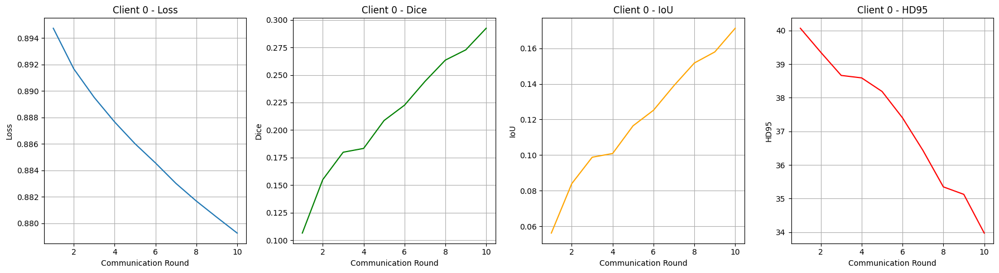

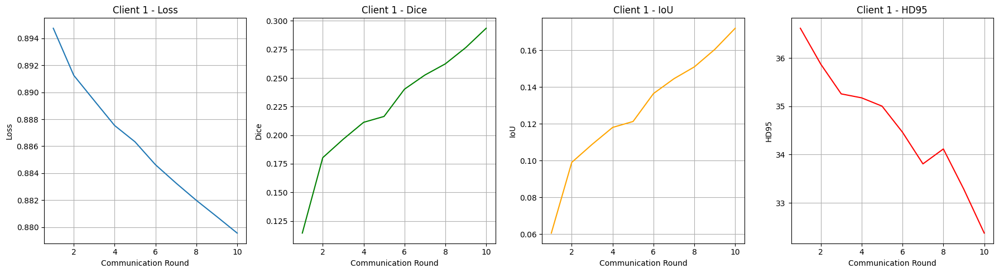

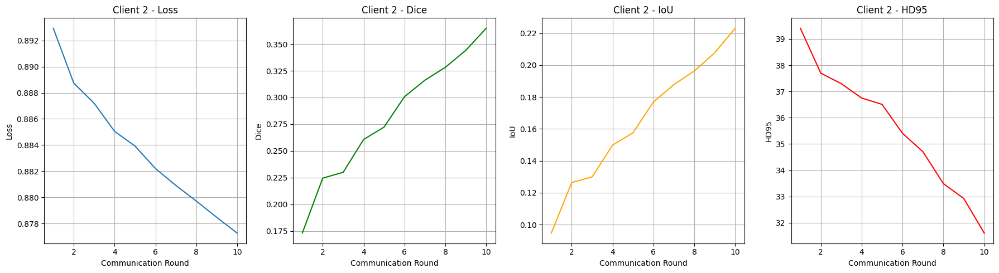

In [56]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

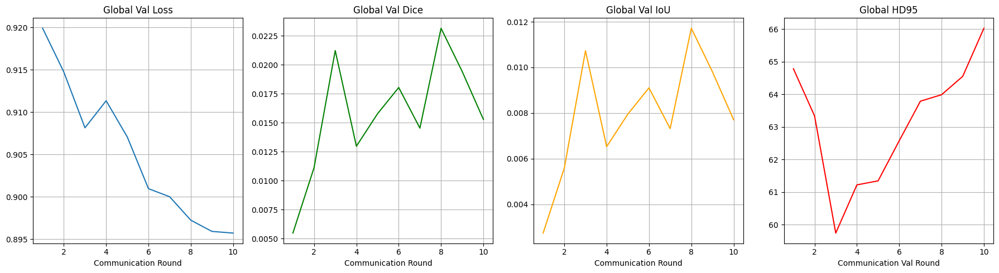

In [57]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [58]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_14292\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing:  54%|█████▍    | 27/50 [00:05<00:03,  6.63it/s, Dice=0.0412, IoU=0.0210, HD95=60.7719]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s, Dice=0.0412, IoU=0.0210, HD95=60.3952]


Test Set Metrics:
Dice: 0.0412
IoU: 0.0210
HD95: 60.3952


**Visualize**

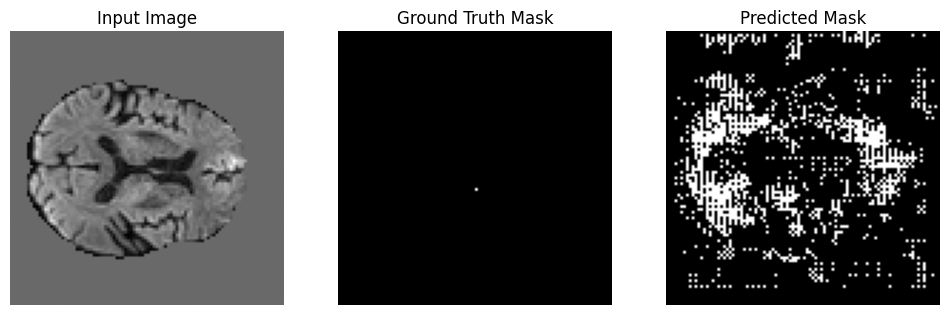

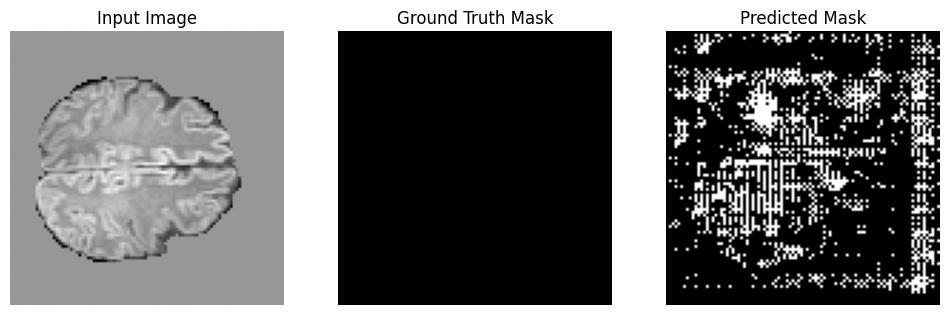

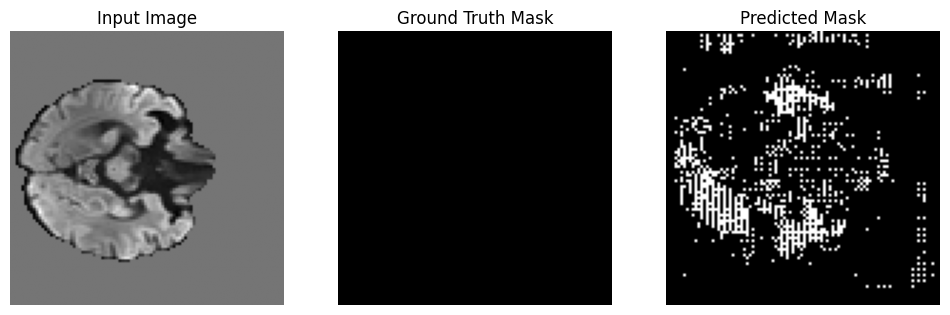

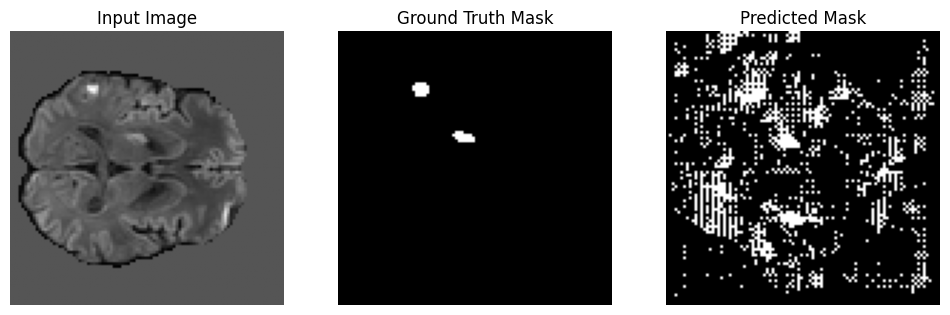

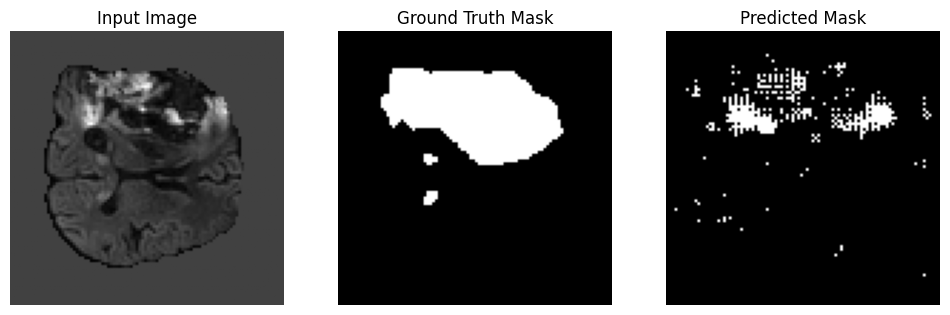

...

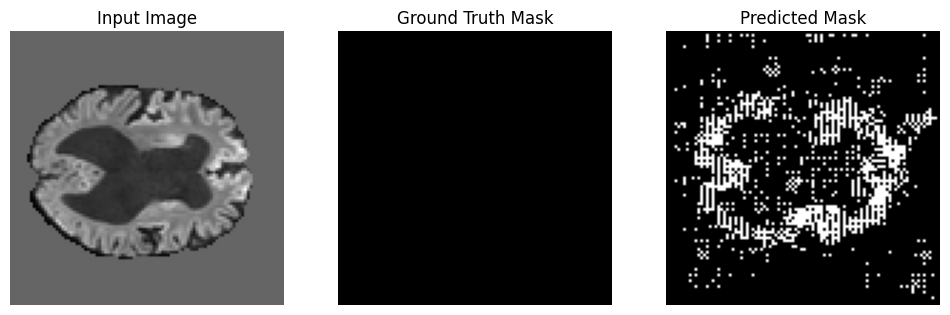

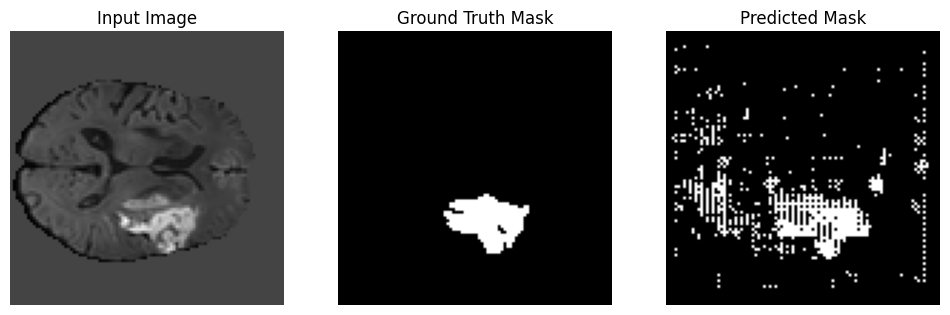

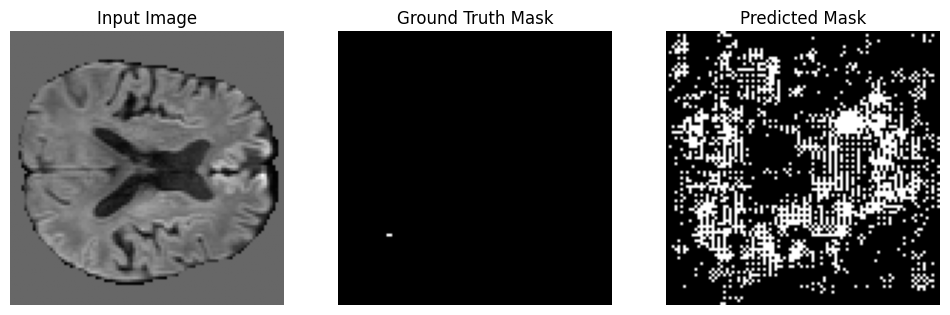

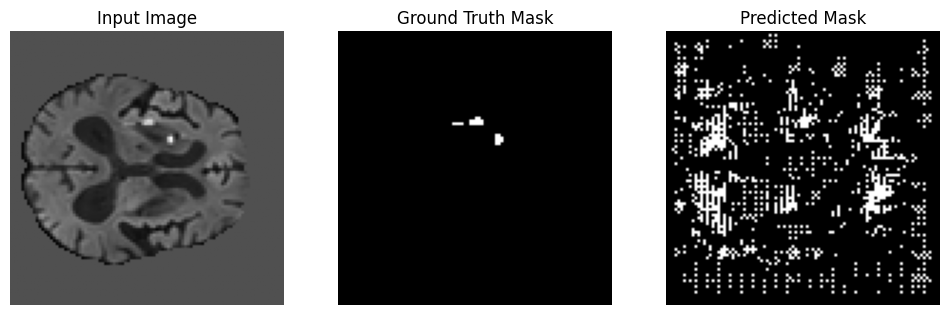

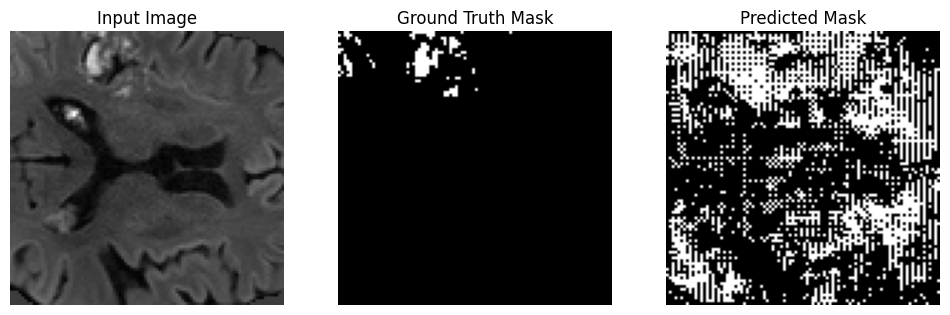

In [59]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()